# Run Ref umt

In [1]:
# Env: sc2_v0
import xarray as xr
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import proplot as pplt # New plot library (https://proplot.readthedocs.io/en/latest/)
pplt.rc['savefig.dpi'] = 300 # 1200 is too big! #https://proplot.readthedocs.io/en/latest/basics.html#Creating-figures
from scipy import stats
import xskillscore as xs
import calendar
import os

In [2]:
site = 'umt'
site_longname = 'Umiujaq TUNDRA, northeastern Canada'
y_start = 2012
y_end = 2021

labels = [
    'DEF_correct_SH',
    # 'BUG_CORRECT',
    # 'BUG_CORRECT_TSNBT_OP1',
    'BUG_CORRECT_TSNBT_OP1_EZERO_correct_SH',
    # 'PHYS_ALL_SUBLI_CORRECT',
    'PHYS_ALL_SUBLI_v2_correct_SH',
    # 'PHYS_ALL_SUBLI_CORRECT_COMPAC',
    'PHYS_ALL_SUBLI_v2_COMPAC_v1_correct_SH',
    'PHYS_ALL_SUBLI_v2_COMPAC_v1_calonne_correct_SH', # Best without TVC (COMPACT_2.5)
    'PHYS_ALL_SUBLI_v2_COMPAC_2.5_LIM_3.5_calonne_correct_SH', # best with TVC
]

root_path = '/home/lalandmi/eccc/classic-develop/outputFiles/SnowArctic/'+site+'/'
paths = [root_path+'run_'+label for label in labels]

# ds_yr_list = [xr.open_mfdataset(path+'/*_annually.nc').squeeze().load() for path in paths]
# ds_mo_list = [xr.open_mfdataset(path+'/*_monthly.nc').squeeze().load() for path in paths]
ds_d_list = [xr.open_mfdataset(path+'/*_daily.nc').squeeze().load() for path in paths]
# ds_hh_list = [xr.open_mfdataset(path+'/*_halfhourly.nc').squeeze().load() for path in paths]

In [3]:
path = "/home/lalandmi/eccc/classic-develop/inputFiles/SnowArctic/"+site
rsfile = xr.open_dataset(path+'/rsfile_spinup-final_Ref.nc')

In [4]:
def assign_center_depth(ds, rsfile):
    layer_c = []
    for i in range(len(rsfile.DELZ)):
        if i == 0:
            layer_c.append(rsfile.DELZ.cumsum().values[i]/2)
        else:
            layer_c.append(rsfile.DELZ.cumsum().values[i-1] + rsfile.DELZ.values[i]/2)
    with xr.set_options(keep_attrs=True):
        ds = ds.assign_coords(layer=ds.layer*0+layer_c)
    return ds

In [5]:
for i in range(len(labels)):
    # ds_yr_list[i] = assign_center_depth(ds_yr_list[i], rsfile)
    # ds_mo_list[i] = assign_center_depth(ds_mo_list[i], rsfile)
    ds_d_list[i] = assign_center_depth(ds_d_list[i], rsfile)
    # ds_hh_list[i] = assign_center_depth(ds_hh_list[i], rsfile)

Text(0.5, 0.98, 'Umiujaq TUNDRA, northeastern Canada')

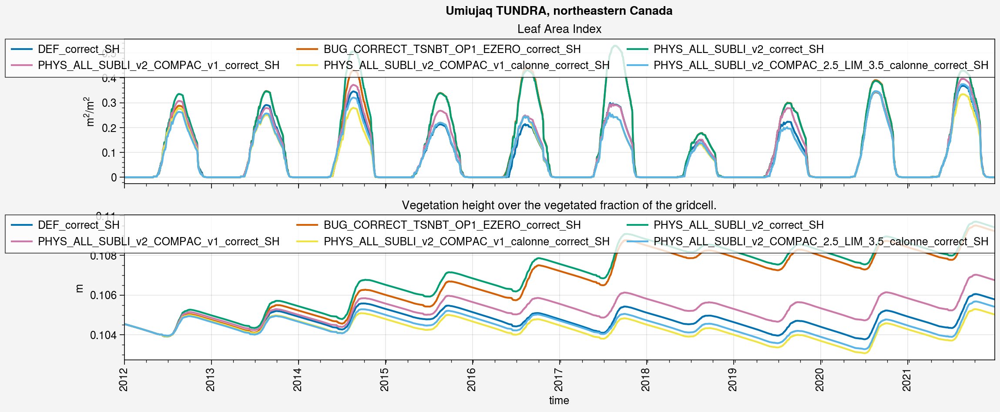

In [6]:
fig, axs = pplt.subplots(ncols=1, nrows=2, refaspect=6, refwidth=10, sharey=0)

for ds_d, label in zip(ds_d_list, labels):
    axs[0].plot(ds_d.lai, label=label)
    axs[1].plot(ds_d.vegHeight, label=label)

axs[0].format(ylabel=ds_d_list[0].lai.units, title=ds_d_list[0].lai.long_name)
axs[1].format(ylabel=ds_d_list[0].vegHeight.units, title=ds_d_list[0].vegHeight.long_name)

for ax in axs:
    ax.legend()

fig.suptitle(site_longname)

Text(0.5, 0.98, 'Umiujaq TUNDRA, northeastern Canada (2012-2021)')

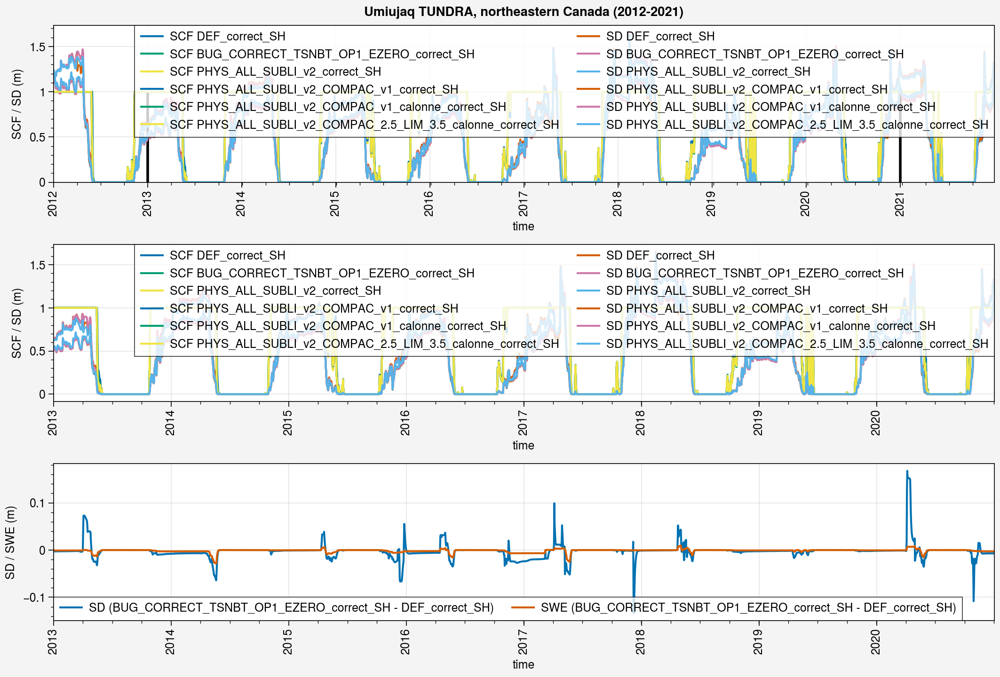

In [7]:
if len(labels) > 1:
    nrows = 3
else: 
    nrows = 2
    
fig, axs = pplt.subplots(ncols=1, nrows=nrows, refaspect=6, refwidth=10, share=0)

##################
### All period ###
##################
start = str(y_start)
end = str(y_end)

for ds_d, label in zip(ds_d_list, labels):
    axs[0].plot(ds_d.snc.sel(time=slice(start,end)), label='SCF '+label)
    axs[0].plot(ds_d.snd.sel(time=slice(start,end)), label='SD '+label)

axs[0].legend(ncols=2, loc='ur')
axs[0].format(
    ylabel='SCF / SD (m)'
)


############
### Zoom ###
############
start = str(y_start+1)
end = str(y_end-1)

for ds_d, label in zip(ds_d_list, labels):
    axs[1].plot(ds_d.snc.sel(time=slice(start,end)), label='SCF '+label)
    axs[1].plot(ds_d.snd.sel(time=slice(start,end)), label='SD '+label)

axs[0].vlines(ds_d_list[0].sel(time=slice(start,end)).time[0], ds_d_list[0].snc.min(), ds_d_list[0].snc.max(), color='k', lw=2)
axs[0].vlines(ds_d_list[0].sel(time=slice(start,end)).time[-1], ds_d_list[0].snc.min(), ds_d_list[0].snc.max(), color='k', lw=2)

axs[1].legend(ncols=2, loc='ur')
axs[1].format(
    ylabel='SCF / SD (m)'
)

if nrows == 3:
    #####################
    ### SWE / SD diff ###
    #####################
    axs[2].plot((ds_d_list[1]-ds_d_list[0]).snd.sel(time=slice(start,end)), label='SD ('+labels[1]+' - '+labels[0]+')')
    axs[2].plot(((ds_d_list[1]-ds_d_list[0]).snw*1e-3).sel(time=slice(start,end)), label='SWE ('+labels[1]+' - '+labels[0]+')')
    
    axs[2].legend(ncols=2)
    axs[2].format(
        ylabel='SD / SWE (m)'
    )

fig.suptitle(site_longname+' ('+str(y_start)+'-'+str(y_end)+')')


## Compare with obs

In [8]:
path_obs = '/home/lalandmi/Dropbox/data/ESM-SnowMIP_all/Umiujaq/Domine-etal_2024/datasets'
df = pd.read_csv(path_obs+'/Umiujaq_snow_height.tab', skiprows=26, delimiter='\t', parse_dates=['Date/Time'], index_col=['Date/Time'])
df

,Event,Snow h [m]
Date/Time,,
2012-09-28 21:00:00,Umiujaq_2012-2021_Tundra,0.000
2012-09-28 22:00:00,Umiujaq_2012-2021_Tundra,0.000
2012-09-28 23:00:00,Umiujaq_2012-2021_Tundra,0.000
2012-09-29 00:00:00,Umiujaq_2012-2021_Tundra,0.000
2012-09-29 01:00:00,Umiujaq_2012-2021_Tundra,0.000
...,...,...
2021-10-19 09:00:00,Umiujaq_2015-2021_Forest,0.053
2021-10-19 10:00:00,Umiujaq_2015-2021_Forest,0.034
2021-10-19 11:00:00,Umiujaq_2015-2021_Forest,0.439


In [9]:
df['Event'][:79338]

Date/Time
2012-09-28 21:00:00    Umiujaq_2012-2021_Tundra
2012-09-28 22:00:00    Umiujaq_2012-2021_Tundra
2012-09-28 23:00:00    Umiujaq_2012-2021_Tundra
2012-09-29 00:00:00    Umiujaq_2012-2021_Tundra
2012-09-29 01:00:00    Umiujaq_2012-2021_Tundra
                                 ...           
2021-10-19 10:00:00    Umiujaq_2012-2021_Tundra
2015-11-26 04:00:00    Umiujaq_2012-2021_Tundra
2015-11-26 05:00:00    Umiujaq_2012-2021_Tundra
2015-11-26 06:00:00    Umiujaq_2012-2021_Tundra
2015-11-26 07:00:00    Umiujaq_2012-2021_Tundra
Name: Event, Length: 79338, dtype: object

In [10]:
path_obs = '/home/lalandmi/Dropbox/data/ESM-SnowMIP_all/Umiujaq/Domine-etal_2024/datasets'

ds_h_obs = xr.open_dataset(path_obs+'/obs_insitu_'+site+'_'+str(y_start)+'_'+str(y_end)+'.nc').load()
ds_h_met = xr.open_dataset(path_obs+'/met_insitu_'+site+'_'+str(y_start)+'_'+str(y_end)+'.nc').load()

ds_d_obs = ds_h_obs.resample(time='D').mean().load()
ds_h_obs

<xarray.Dataset> Size: 12MB
Dimensions:   (time: 79386, veg: 2, sdepth: 4)
Coordinates:
  * time      (time) datetime64[ns] 635kB 2012-09-28T17:00:00 ... 2021-10-19T...
  * veg       (veg) <U8 64B 'lichen' 'lowshrub'
  * sdepth    (sdepth) float64 32B 0.15 0.25 0.35 0.45
Data variables:
    snd_auto  (time) float64 635kB 0.0 0.0 0.0 0.0 0.0 ... nan nan nan nan
    mrsll     (veg, sdepth, time) float64 5MB nan nan nan nan ... nan nan nan
    tsl       (veg, sdepth, time) float64 5MB nan nan nan nan ... nan nan nan
    albs      (time) float64 635kB 0.08978 nan nan nan ... 0.2071 0.2169 0.247
Attributes:
    event:          Umiujaq_2012-2021_Tundra
    link:           https://doi.pangaea.de/10.1594/PANGAEA.964743
    downloaded:     27/02/2024 by Mickaël Lalande
    original_file:  Domine-etal_2024/datasets/Umiujaq_snow_height.tab, Umiuja...

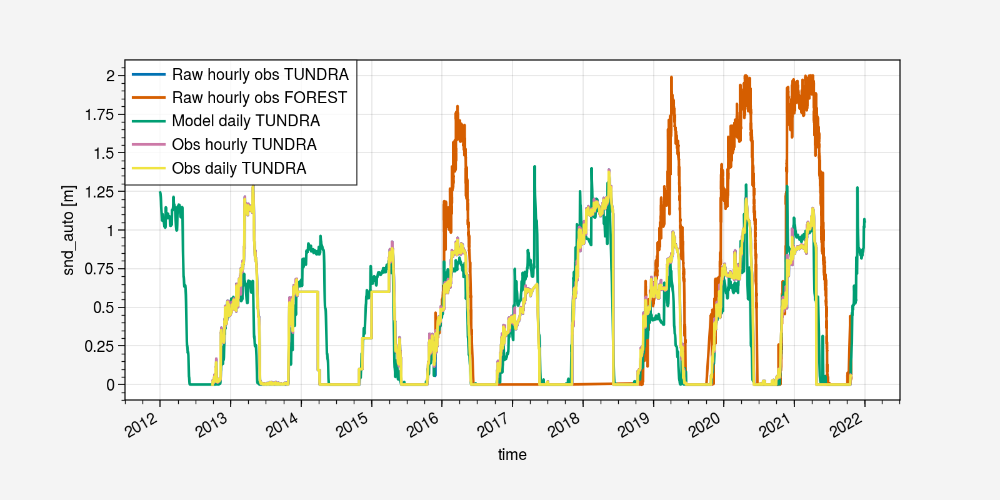

In [11]:
%matplotlib inline
plt.figure(figsize=(8,4))
df['Snow h [m]'][:79338].plot(label='Raw hourly obs TUNDRA')
df['Snow h [m]'][79338:].plot(label='Raw hourly obs FOREST')
ds_d.snd.plot(label='Model daily TUNDRA')
ds_h_obs.snd_auto.plot(label='Obs hourly TUNDRA')
ds_d_obs.snd_auto.plot(label='Obs daily TUNDRA')
plt.legend()

In [12]:
tot_year = y_end - y_start + 1
gap = 4
years = pplt.arange(y_start, y_end)
years

array([2012, 2013, 2014, 2015, 2016, 2017, 2018, 2019, 2020, 2021])

### SD

In [13]:
ds_d_obs

<xarray.Dataset> Size: 503kB
Dimensions:   (veg: 2, sdepth: 4, time: 3309)
Coordinates:
  * veg       (veg) <U8 64B 'lichen' 'lowshrub'
  * sdepth    (sdepth) float64 32B 0.15 0.25 0.35 0.45
  * time      (time) datetime64[ns] 26kB 2012-09-28 2012-09-29 ... 2021-10-19
Data variables:
    snd_auto  (time) float64 26kB 0.0 0.01196 0.02252 ... 0.03703 0.05901 0.0582
    mrsll     (time, veg, sdepth) float64 212kB nan nan nan nan ... nan nan nan
    tsl       (time, veg, sdepth) float64 212kB nan nan nan nan ... nan nan nan
    albs      (time) float64 26kB 0.08978 0.0732 0.1486 ... 0.1283 0.119 0.1677
Attributes:
    event:          Umiujaq_2012-2021_Tundra
    link:           https://doi.pangaea.de/10.1594/PANGAEA.964743
    downloaded:     27/02/2024 by Mickaël Lalande
    original_file:  Domine-etal_2024/datasets/Umiujaq_snow_height.tab, Umiuja...

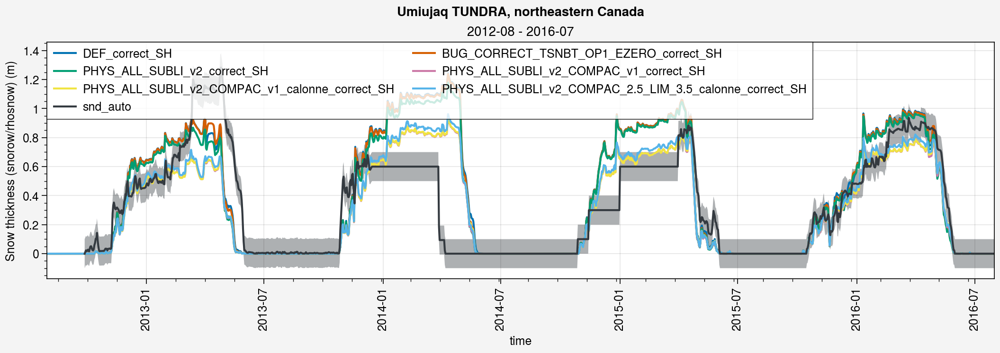

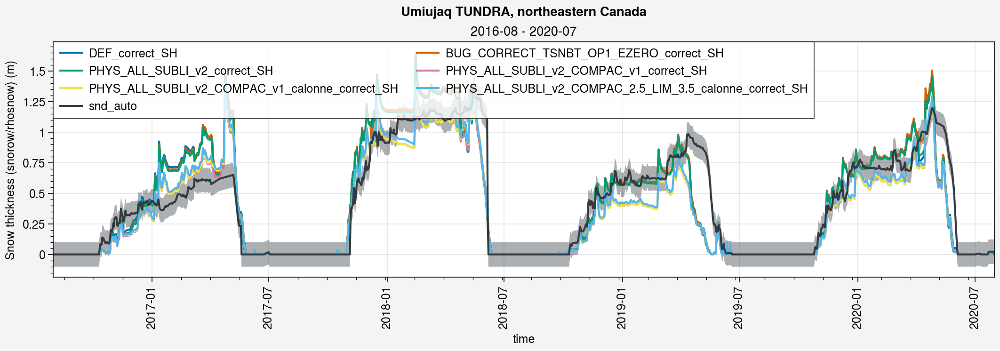

In [14]:
%matplotlib inline

color_obs = 'gray8'

for i in range(tot_year//gap):
    fig, axs = pplt.subplots(ncols=1, nrows=1, refaspect=4, refwidth=10)

    if i*gap+gap < tot_year:
        period=slice(str(years[i*gap])+'-08',str(years[i*gap+gap])+'-07')
    else:
        period=slice(str(years[i*gap])+'-08',str(years[-1])+'-07')
    
    # Simus
    for ds_d, label in zip(ds_d_list, labels):
        axs[0].plot(ds_d.snd.sel(time=period), label=label)
    
    # Obs
    shadedata = np.concatenate((
        np.expand_dims(ds_d_obs.snd_auto.sel(time=period).values+0.1, axis=0),
        np.expand_dims(ds_d_obs.snd_auto.sel(time=period).values-0.1, axis=0),), axis=0)
    axs[0].plot(ds_d_obs.snd_auto.sel(time=period), shadedata=shadedata, color=color_obs)
    # axs[0].plot(ds_d_obs.snd_man.sel(time=period), marker='.', color=color_obs)

    # Veg
    # axs[0].plot(ds_d_list[0].vegHeight.sel(time=period), label='vegHeight', color='green', ls='-', lw=0.5, alpha=0.5)
    
    axs[0].legend(loc='ul', ncols=2)
    axs[0].format(title=period.start+' - '+period.stop)
    
    fig.suptitle(site_longname)
    # fig.save('bylot_snd.pdf')

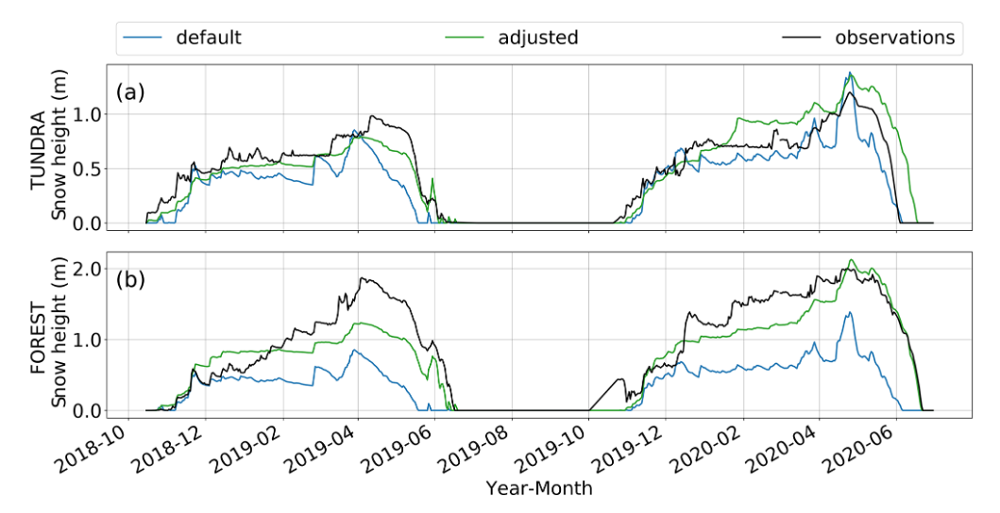

### SWE

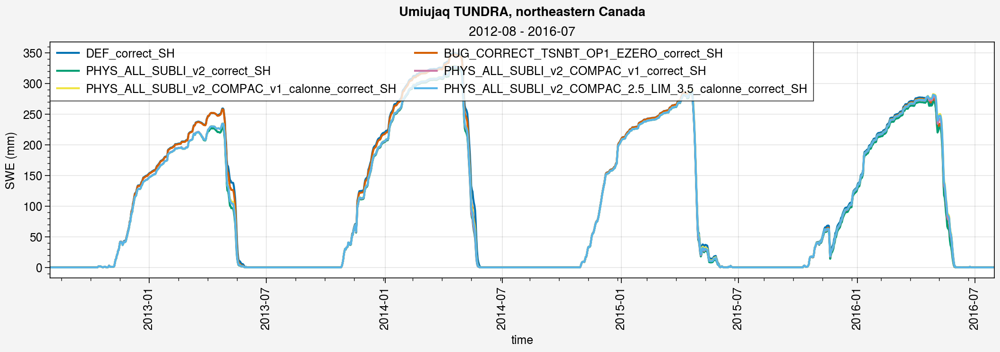

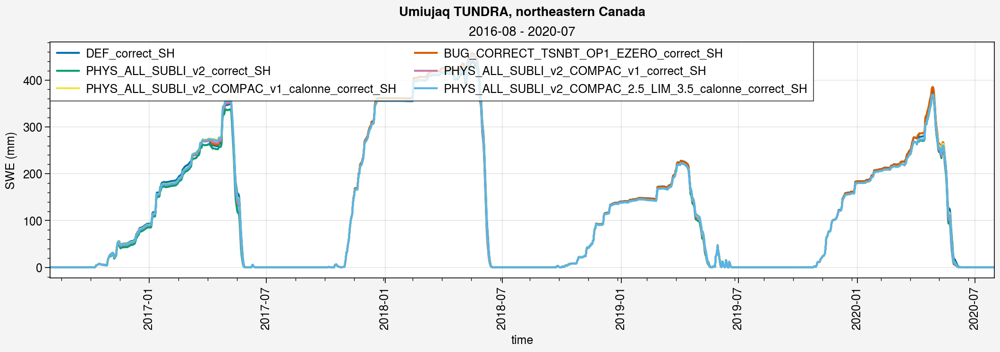

In [15]:
%matplotlib inline

color_obs = 'gray8'

for i in range(tot_year//gap):
    fig, axs = pplt.subplots(ncols=1, nrows=1, refaspect=4, refwidth=10)

    if i*gap+gap < tot_year:
        period=slice(str(years[i*gap])+'-08',str(years[i*gap+gap])+'-07')
    else:
        period=slice(str(years[i*gap])+'-08',str(years[-1])+'-07')
    
    # Simus
    for ds_d, label in zip(ds_d_list, labels):
        axs[0].plot(ds_d.snw.sel(time=period), label=label)
    
    # Obs
    # shadedata = np.concatenate((
    #     np.expand_dims(ds_d_obs.snw_auto.sel(time=period).values+25, axis=0),
    #     np.expand_dims(ds_d_obs.snw_auto.sel(time=period).values-25, axis=0),), axis=0)
    # axs[0].plot(ds_d_obs.snw_auto.sel(time=period), shadedata=shadedata, color=color_obs)
    # axs[0].plot(ds_d_obs.snw_man.sel(time=period), marker='.', color=color_obs)
    
    axs[0].legend(loc='ul', ncols=2)
    axs[0].format(title=period.start+' - '+period.stop, ylabel='SWE (mm)')
    
    fig.suptitle(site_longname)


### Albedo

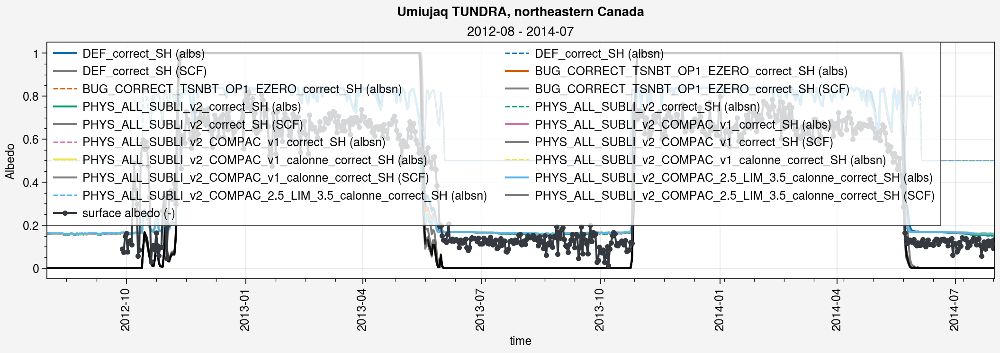

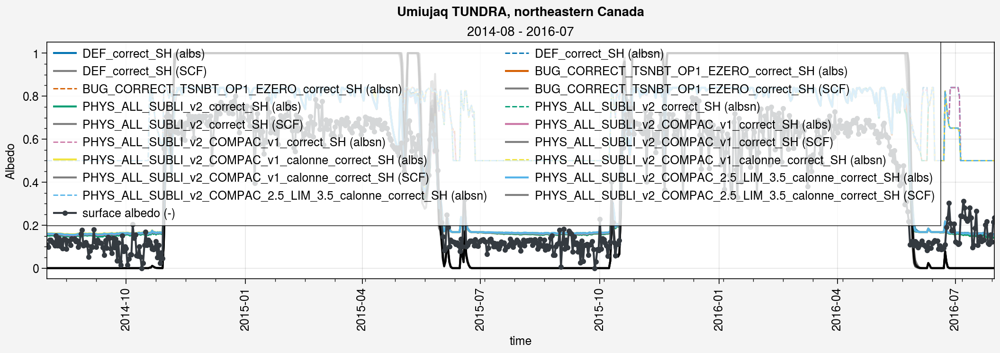

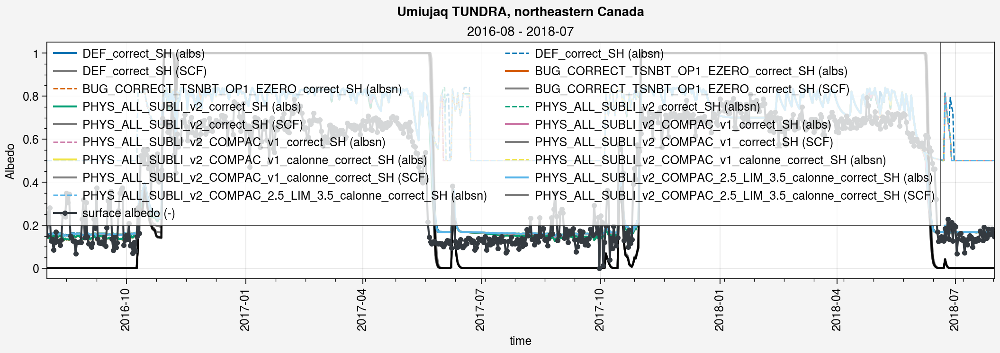

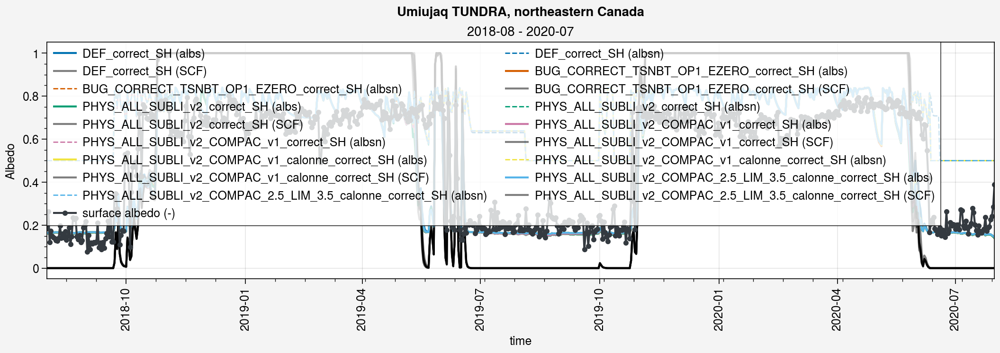

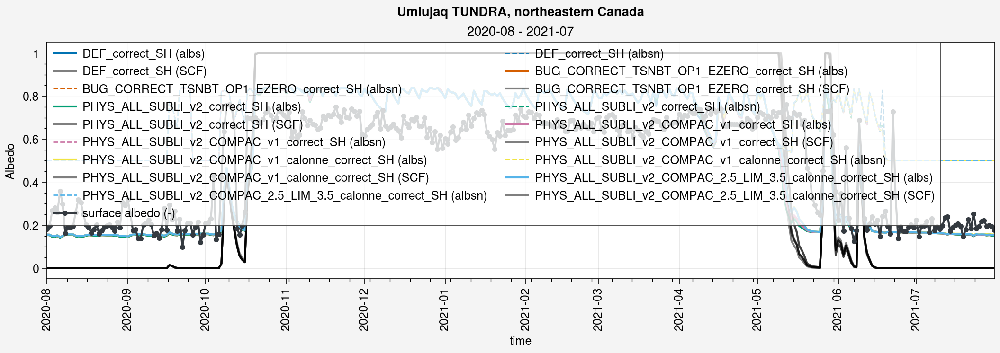

In [16]:
%matplotlib inline
gap = 2
color_obs = 'gray8'

for i in range(tot_year//gap):
    fig, axs = pplt.subplots(ncols=1, nrows=1, refaspect=4, refwidth=10)

    if i*gap+gap < tot_year:
        period=slice(str(years[i*gap])+'-08',str(years[i*gap+gap])+'-07')
    else:
        period=slice(str(years[i*gap])+'-08',str(years[-1])+'-07')
    
    # Simus
    k = 0
    for ds_d, label in zip(ds_d_list, labels):
        axs[0].plot(ds_d.albs.sel(time=period), label=label+' (albs)', color='C'+str(k))
        axs[0].plot(ds_d.albsn.sel(time=period), label=label+' (albsn)', color='C'+str(k), ls='--', lw=1)
        axs[0].plot(ds_d.snc.sel(time=period), label=label+' (SCF)', color='k', alpha=0.5)
        
        k+=1
    
    # Obs
    axs[0].plot(ds_d_obs.albs.sel(time=period), marker='.', color=color_obs)
    
    axs[0].legend(loc='ul', ncols=2)
    axs[0].format(title=period.start+' - '+period.stop, ylabel='Albedo')
    
    fig.suptitle(site_longname)


### Surface Temperature

Domine et al. ([2019](https://onlinelibrary.wiley.com/doi/abs/10.1029/2018MS001445)): "**Averaged over a period of several days the surface temperatures are essentially the same**. The amplitude variations are greater in the Alpine snowpack (Figure 8b) because the insulating layer at the top does not allow damping the air temperature variations by heat exchanges with the snowpack. This effect is more important in April and May, when daily temperature variations reach 20 °C, sometimes more. The absolute temperature differences reaches 4.7 °C on 8 February, when the temperature suddenly increases by 15 °C in 5 hr, and the surface temperature of the Alpine snowpack increases more rapidly."

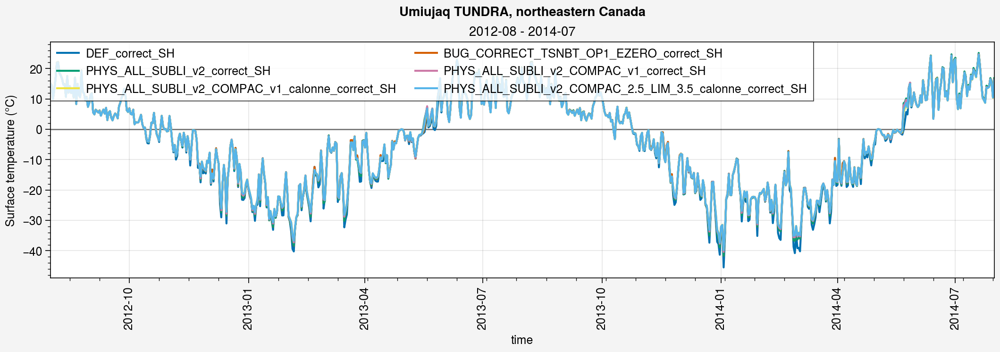

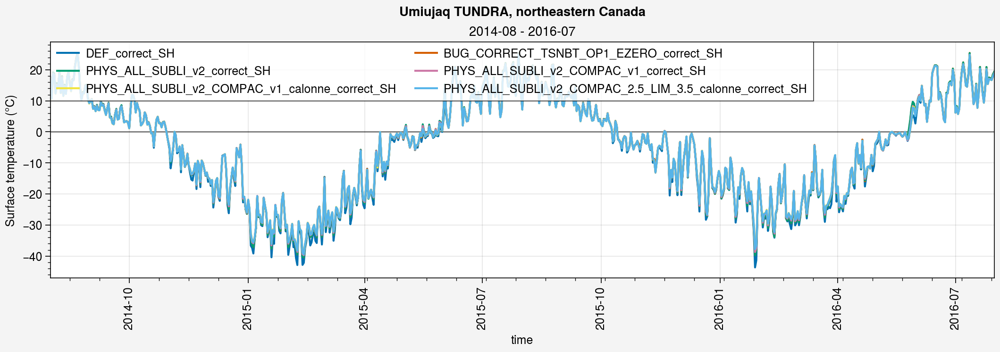

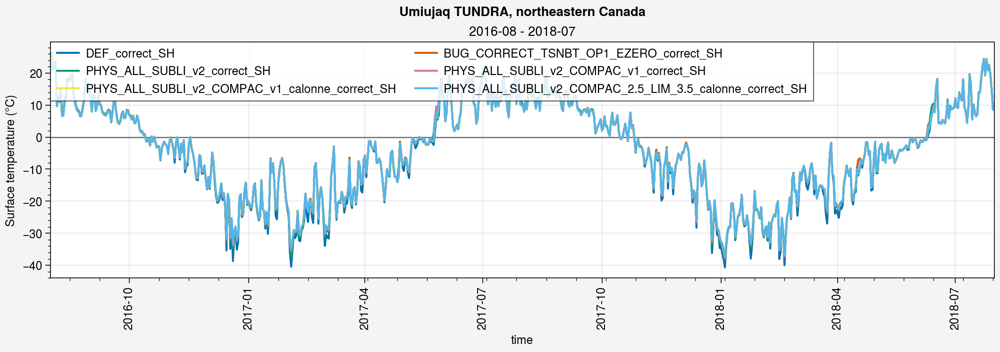

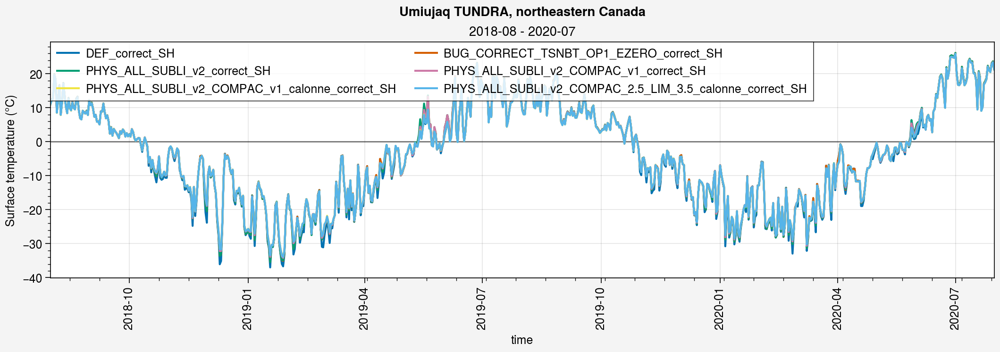

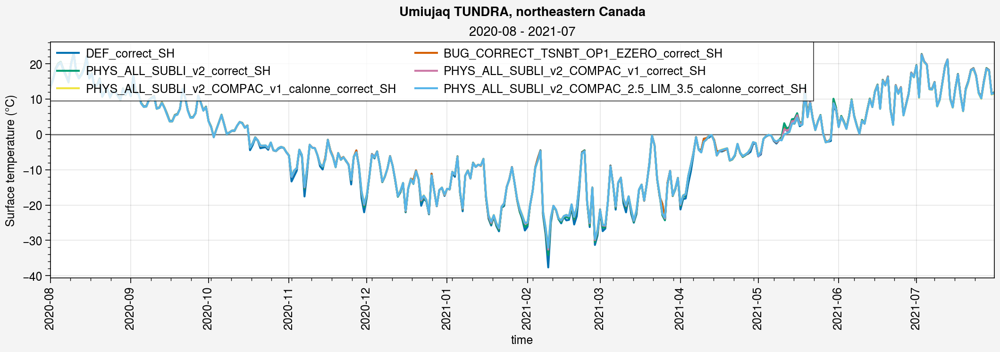

In [17]:
%matplotlib inline
gap = 2
color_obs = 'gray8'

for i in range(tot_year//gap):
    fig, axs = pplt.subplots(ncols=1, nrows=1, refaspect=4, refwidth=10)

    if i*gap+gap < tot_year:
        period=slice(str(years[i*gap])+'-08',str(years[i*gap+gap])+'-07')
    else:
        period=slice(str(years[i*gap])+'-08',str(years[-1])+'-07')
    
    # Simus
    for ds_d, label in zip(ds_d_list, labels):
        axs[0].plot(ds_d.ts.sel(time=period)-273.15, label=label)
    
    # Obs
    # axs[0].plot(ds_d_obs.ts.sel(time=period), color=color_obs)
    axs[0].hlines(0, ds_d.ts.sel(time=period).time[0], ds_d.ts.sel(time=period).time[-1], c='k', lw=1, alpha=0.5)
    
    axs[0].legend(loc='ul', ncols=2)
    axs[0].format(title=period.start+' - '+period.stop, ylabel='Surface temperature (°C)')
    
    fig.suptitle(site_longname)


### Soil Temperature

In [18]:
ds_d_obs

<xarray.Dataset> Size: 503kB
Dimensions:   (veg: 2, sdepth: 4, time: 3309)
Coordinates:
  * veg       (veg) <U8 64B 'lichen' 'lowshrub'
  * sdepth    (sdepth) float64 32B 0.15 0.25 0.35 0.45
  * time      (time) datetime64[ns] 26kB 2012-09-28 2012-09-29 ... 2021-10-19
Data variables:
    snd_auto  (time) float64 26kB 0.0 0.01196 0.02252 ... 0.03703 0.05901 0.0582
    mrsll     (time, veg, sdepth) float64 212kB nan nan nan nan ... nan nan nan
    tsl       (time, veg, sdepth) float64 212kB nan nan nan nan ... nan nan nan
    albs      (time) float64 26kB 0.08978 0.0732 0.1486 ... 0.1283 0.119 0.1677
Attributes:
    event:          Umiujaq_2012-2021_Tundra
    link:           https://doi.pangaea.de/10.1594/PANGAEA.964743
    downloaded:     27/02/2024 by Mickaël Lalande
    original_file:  Domine-etal_2024/datasets/Umiujaq_snow_height.tab, Umiuja...

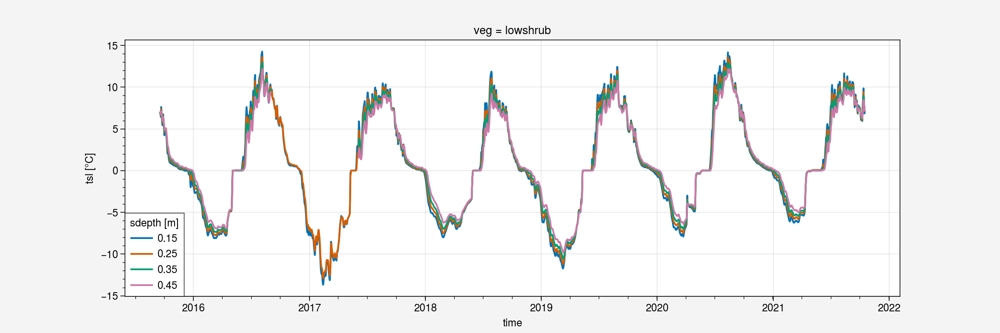

In [19]:
%matplotlib inline
ds_d_obs.tsl.sel(veg='lowshrub').plot(hue='sdepth', figsize=(12, 4))

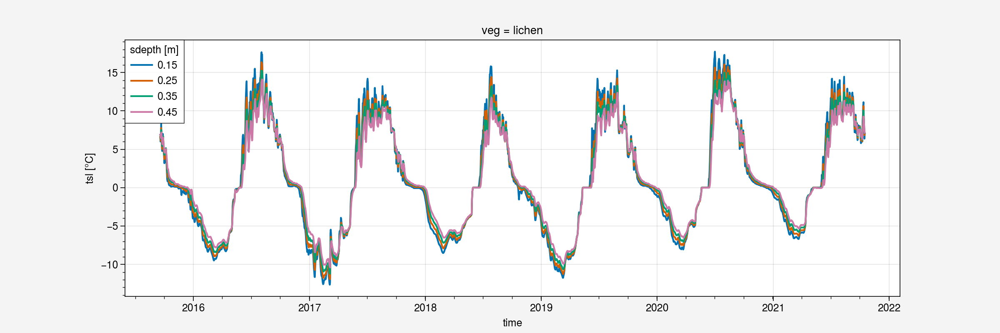

In [20]:
%matplotlib inline
ds_d_obs.tsl.sel(veg='lichen').plot(hue='sdepth', figsize=(12, 4))

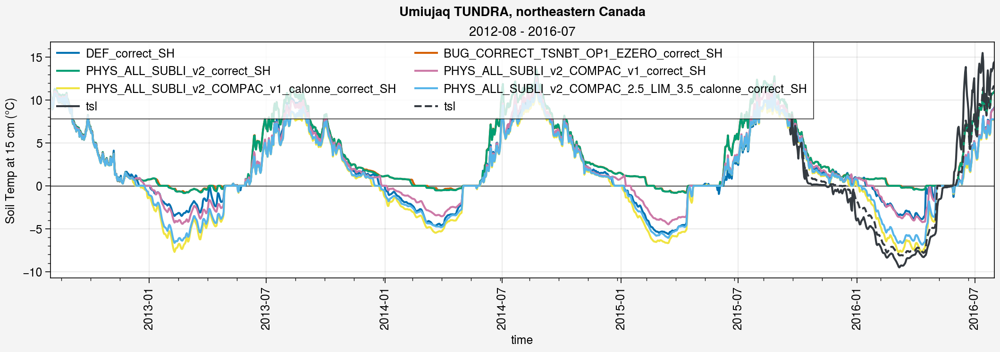

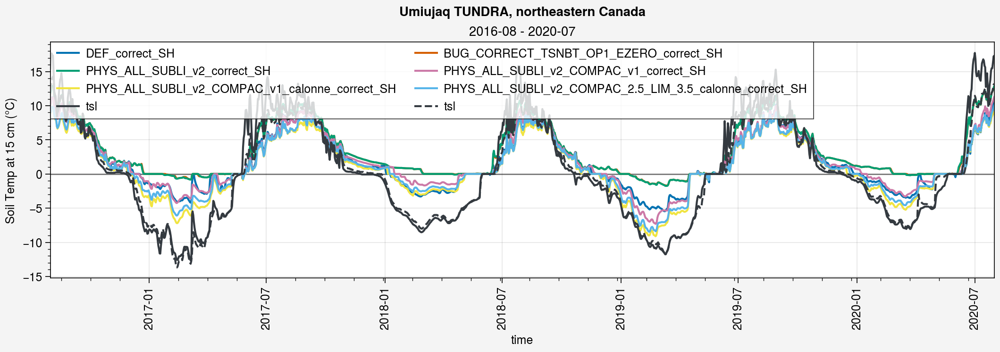

In [21]:
%matplotlib inline
gap = 4
color_obs = 'gray8'
sdepth = 0.15
sdepth_label = str(int(sdepth*100))

for i in range(tot_year//gap):
    fig, axs = pplt.subplots(ncols=1, nrows=1, refaspect=4, refwidth=10)

    if i*gap+gap < tot_year:
        period=slice(str(years[i*gap])+'-08',str(years[i*gap+gap])+'-07')
    else:
        period=slice(str(years[i*gap])+'-08',str(years[-1])+'-07')
    
    # Simus
    for ds_d, label in zip(ds_d_list, labels):
        # axs[0].plot(((ds_d.tsl.sel(time=period, layer=1)+ds_d.tsl.sel(time=period, layer=2))/2)-273.15, label=label)
        # axs[0].plot(((ds_d.tsl.sel(time=period).isel(layer=0)+ds_d.tsl.sel(time=period).isel(layer=1))/2)-273.15, label=label)
        # axs[0].plot(ds_d.tsl.sel(time=period).interp(layer=ds_d_obs.sdepth.values).sel(layer=0.1)-273.15, label=label)
        axs[0].plot(ds_d.tsl.sel(time=period).sel(layer=sdepth, method='nearest')-273.15, label=label)
        
    # Obs
    # shadedata = np.concatenate((
    #     np.expand_dims(ds_d_obs.tsl.sel(time=period, sdepth=sdepth)+1, axis=0),
    #     np.expand_dims(ds_d_obs.tsl.sel(time=period, sdepth=sdepth)-1, axis=0),), axis=0)
    # axs[0].plot(ds_d_obs.tsl.sel(time=period, sdepth=sdepth), shadedata=shadedata, marker='.', color=color_obs)
    axs[0].plot(ds_d_obs.tsl.sel(time=period, sdepth=sdepth, veg='lichen'), color=color_obs)
    axs[0].plot(ds_d_obs.tsl.sel(time=period, sdepth=sdepth, veg='lowshrub'), color=color_obs, ls='--')
    
    axs[0].hlines(0, ds_d.tsl.sel(time=period).time[0], ds_d.tsl.sel(time=period).time[-1], c='k', lw=1, alpha=0.5)
    axs[0].legend(loc='ul', ncols=2)
    axs[0].format(title=period.start+' - '+period.stop, ylabel='Soil Temp at '+sdepth_label+' cm (°C)')
    
    fig.suptitle(site_longname)


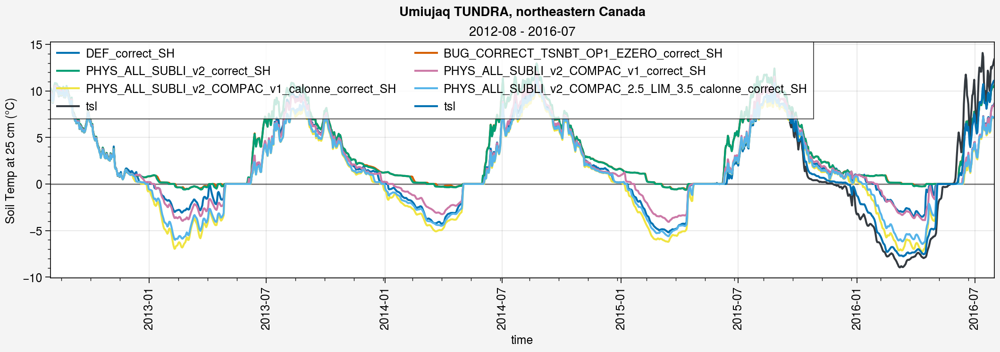

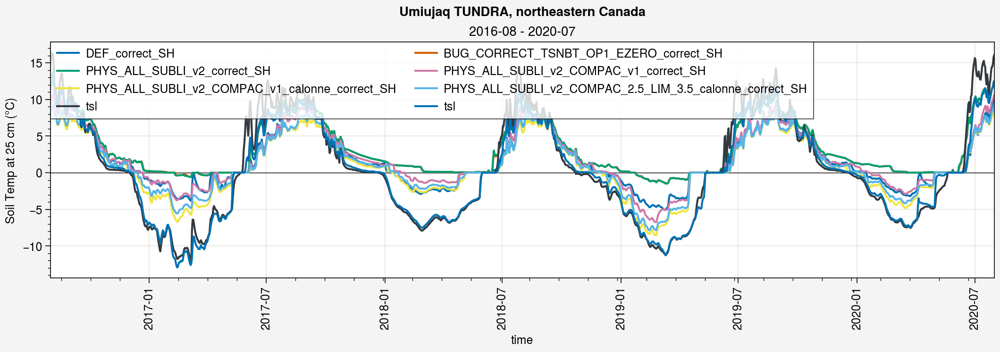

In [22]:
%matplotlib inline
gap = 4
color_obs = 'gray8'
sdepth = 0.25
sdepth_label = str(int(sdepth*100))

for i in range(tot_year//gap):
    fig, axs = pplt.subplots(ncols=1, nrows=1, refaspect=4, refwidth=10)

    if i*gap+gap < tot_year:
        period=slice(str(years[i*gap])+'-08',str(years[i*gap+gap])+'-07')
    else:
        period=slice(str(years[i*gap])+'-08',str(years[-1])+'-07')
    
    # Simus
    for ds_d, label in zip(ds_d_list, labels):
        # axs[0].plot(((ds_d.tsl.sel(time=period, layer=1)+ds_d.tsl.sel(time=period, layer=2))/2)-273.15, label=label)
        # axs[0].plot(((ds_d.tsl.sel(time=period).isel(layer=0)+ds_d.tsl.sel(time=period).isel(layer=1))/2)-273.15, label=label)
        # axs[0].plot(ds_d.tsl.sel(time=period).interp(layer=ds_d_obs.sdepth.values).sel(layer=0.1)-273.15, label=label)
        axs[0].plot(ds_d.tsl.sel(time=period).sel(layer=sdepth, method='nearest')-273.15, label=label)
        
    # Obs
    # shadedata = np.concatenate((
    #     np.expand_dims(ds_d_obs.tsl.sel(time=period, sdepth=sdepth)+1, axis=0),
    #     np.expand_dims(ds_d_obs.tsl.sel(time=period, sdepth=sdepth)-1, axis=0),), axis=0)
    # axs[0].plot(ds_d_obs.tsl.sel(time=period, sdepth=sdepth), shadedata=shadedata, marker='.', color=color_obs)
    axs[0].plot(ds_d_obs.tsl.sel(time=period, sdepth=sdepth, veg='lichen'), color=color_obs)
    axs[0].plot(ds_d_obs.tsl.sel(time=period, sdepth=sdepth, veg='lowshrub'))
    
    axs[0].hlines(0, ds_d.tsl.sel(time=period).time[0], ds_d.tsl.sel(time=period).time[-1], c='k', lw=1, alpha=0.5)
    axs[0].legend(loc='ul', ncols=2)
    axs[0].format(title=period.start+' - '+period.stop, ylabel='Soil Temp at '+sdepth_label+' cm (°C)')
    
    fig.suptitle(site_longname)


### Volumetric water content

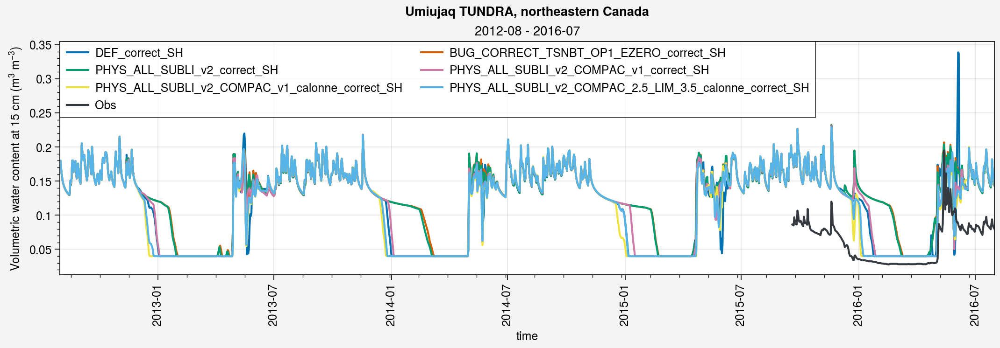

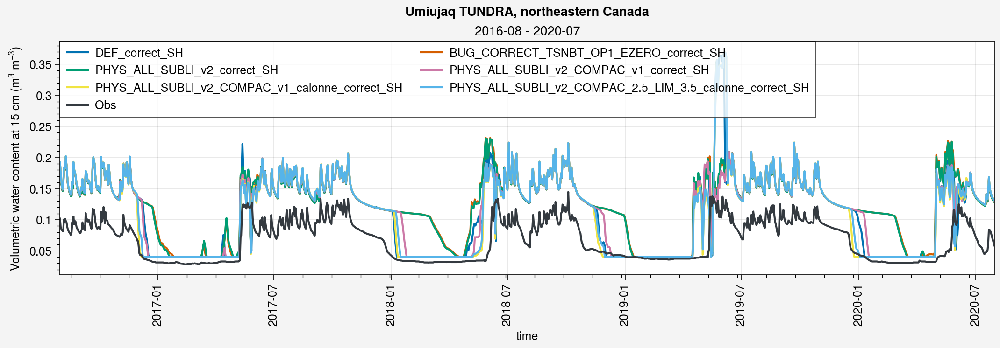

In [23]:
%matplotlib inline
gap = 4
color_obs = 'gray8'
sdepth = 0.15
sdepth_label = str(int(sdepth*100))

for i in range(tot_year//gap):
    fig, axs = pplt.subplots(ncols=1, nrows=1, refaspect=4, refwidth=10)

    if i*gap+gap < tot_year:
        period=slice(str(years[i*gap])+'-08',str(years[i*gap+gap])+'-07')
    else:
        period=slice(str(years[i*gap])+'-08',str(years[-1])+'-07')
    
    # Simus
    for ds_d, label in zip(ds_d_list, labels):
        axs[0].plot(ds_d.mrsll.sel(time=period).sel(layer=sdepth, method='nearest')/100, label=label)
        
    # Obs
    axs[0].plot(ds_d_obs.mrsll.sel(time=period, sdepth=sdepth, veg='lowshrub'), color=color_obs, label='Obs')
    
    axs[0].legend(loc='ul', ncols=2)
    axs[0].format(title=period.start+' - '+period.stop, ylabel='Volumetric water content at '+sdepth_label+' cm (m$^3$ m$^{-3}$)')
    
    fig.suptitle(site_longname)


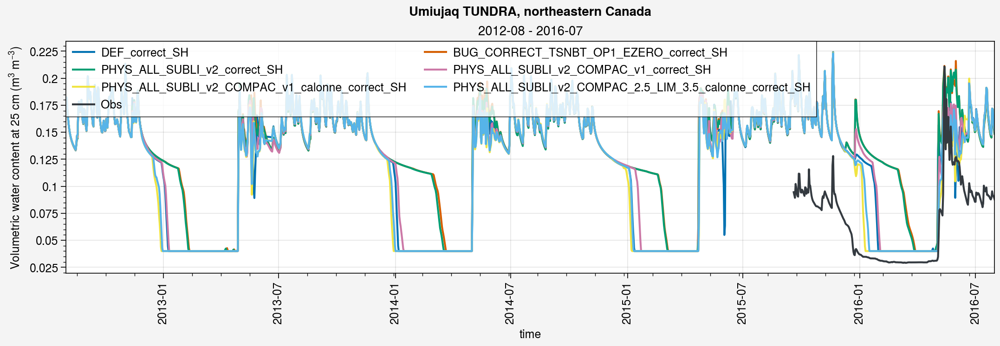

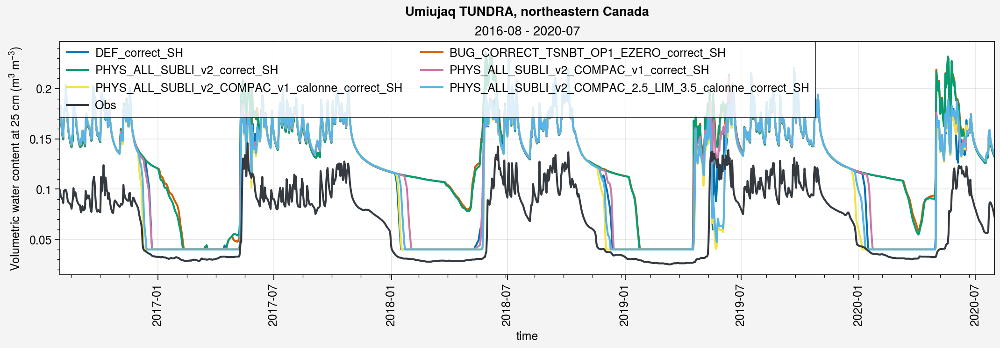

In [24]:
%matplotlib inline
gap = 4
color_obs = 'gray8'
sdepth = 0.25
sdepth_label = str(int(sdepth*100))

for i in range(tot_year//gap):
    fig, axs = pplt.subplots(ncols=1, nrows=1, refaspect=4, refwidth=10)

    if i*gap+gap < tot_year:
        period=slice(str(years[i*gap])+'-08',str(years[i*gap+gap])+'-07')
    else:
        period=slice(str(years[i*gap])+'-08',str(years[-1])+'-07')
    
    # Simus
    for ds_d, label in zip(ds_d_list, labels):
        axs[0].plot(ds_d.mrsll.sel(time=period).sel(layer=sdepth, method='nearest')/100, label=label)
        
    # Obs
    axs[0].plot(ds_d_obs.mrsll.sel(time=period, sdepth=sdepth, veg='lowshrub'), color=color_obs, label='Obs')
    
    axs[0].legend(loc='ul', ncols=2)
    axs[0].format(title=period.start+' - '+period.stop, ylabel='Volumetric water content at '+sdepth_label+' cm (m$^3$ m$^{-3}$)')
    
    fig.suptitle(site_longname)


## All

Text(0.5, 0.98, 'Umiujaq TUNDRA, northeastern Canada (2015-10-01 - 2020-06-01)')

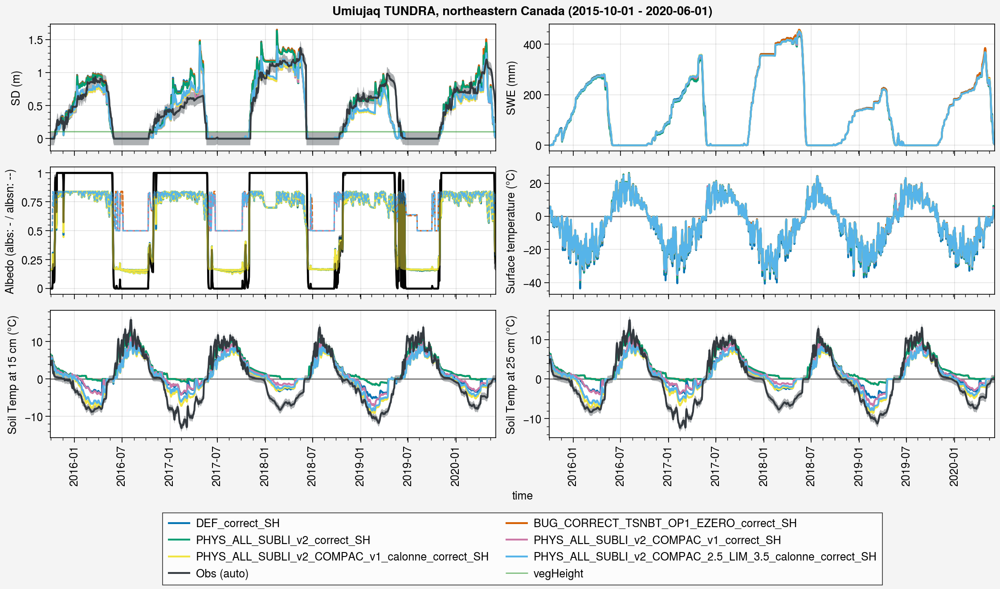

In [25]:
%matplotlib inline
color_obs = 'gray8'
period=slice('2015-10-01', '2020-06-01')

fig, axs = pplt.subplots(nrows=3, ncols=2, refaspect=3.5, sharey=0, refwidth=5)

##################
### Snow Depth ###
##################

# Simus
for ds_d, label in zip(ds_d_list, labels):
    axs[0].plot(ds_d.snd.sel(time=period), label=label)

# Obs
shadedata = np.concatenate((
    np.expand_dims(ds_d_obs.snd_auto.sel(time=period).values+0.1, axis=0),
    np.expand_dims(ds_d_obs.snd_auto.sel(time=period).values-0.1, axis=0),), axis=0)
axs[0].plot(ds_d_obs.snd_auto.sel(time=period), shadedata=shadedata, color=color_obs, label='Obs (auto)')

# Veg
axs[0].plot(ds_d_list[0].vegHeight.sel(time=period), label='vegHeight', color='green', alpha=0.5, lw=1)

fig.legend(loc='b', ncols=2)
axs[0].format(ylabel='SD (m)')

##################
### SWE ###
##################
 # Simus
for ds_d, label in zip(ds_d_list, labels):
    axs[1].plot(ds_d.snw.sel(time=period), label=label)

# Obs
# shadedata = np.concatenate((
#     np.expand_dims(ds_d_eval_menard2019.snw_auto.sel(time=period).values+25, axis=0),
#     np.expand_dims(ds_d_eval_menard2019.snw_auto.sel(time=period).values-25, axis=0),), axis=0)
# axs[1].plot(ds_d_eval_menard2019.snw_auto.sel(time=period), shadedata=shadedata, color=color_obs)
# axs[1].plot(ds_d_eval_menard2019.snw_man.sel(time=period), marker='.', color=color_obs)
axs[1].format(ylabel='SWE (mm)')

##################
### Albedo ###
##################
# Simus
for ds_d, label in zip(ds_d_list, labels):
    axs[2].plot(ds_d.albs.sel(time=period), label=label+' (albs)')
    axs[2].plot(ds_d.albsn.sel(time=period), label=label+' (albsn)', ls='--', lw=1)
    axs[2].plot(ds_d.snc.sel(time=period), label=label+' (SCF)', color='k', alpha=0.5)

# Obs
# axs[2].plot(ds_d_eval_menard2019.albs.sel(time=period), marker='.', color=color_obs)
axs[2].format(ylabel='Albedo (albs: - / albsn: --)')

##################
### TS ###
##################
# Simus
for ds_d, label in zip(ds_d_list, labels):
    axs[3].plot(ds_d.ts.sel(time=period)-273.15, label=label)

# Obs
# axs[3].plot(ds_d_obs.ts.sel(time=period), color=color_obs)
axs[3].hlines(0, ds_d.ts.sel(time=period).time[0], ds_d.ts.sel(time=period).time[-1], c='k', lw=1, alpha=0.5)
axs[3].format(ylabel='Surface temperature (°C)')

##################
### T soil ###
##################
# Simus
for ds_d, label in zip(ds_d_list, labels):
    axs[4].plot(ds_d.tsl.sel(time=period).sel(layer=0.15, method='nearest')-273.15, label=label)
    
# Obs
shadedata = np.concatenate((
    np.expand_dims(ds_d_obs.tsl.mean('veg').sel(time=period, sdepth=0.15)+1, axis=0),
    np.expand_dims(ds_d_obs.tsl.mean('veg').sel(time=period, sdepth=0.15)-1, axis=0),), axis=0)
axs[4].plot(ds_d_obs.tsl.mean('veg').sel(time=period, sdepth=0.15), shadedata=shadedata, color=color_obs)

axs[4].hlines(0, ds_d.tsl.sel(time=period).time[0], ds_d.tsl.sel(time=period).time[-1], c='k', lw=1, alpha=0.5)
axs[4].format(ylabel='Soil Temp at 15 cm (°C)')

# Simus
for ds_d, label in zip(ds_d_list, labels):
    axs[5].plot(ds_d.tsl.sel(time=period).sel(layer=0.25, method='nearest')-273.15, label=label)

# Obs
shadedata = np.concatenate((
    np.expand_dims(ds_d_obs.tsl.mean('veg').sel(time=period, sdepth=0.25)+1, axis=0),
    np.expand_dims(ds_d_obs.tsl.mean('veg').sel(time=period, sdepth=0.25)-1, axis=0),), axis=0)
axs[5].plot(ds_d_obs.tsl.mean('veg').sel(time=period, sdepth=0.25), shadedata=shadedata, color=color_obs)

axs[5].hlines(0, ds_d.tsl.sel(time=period).time[0], ds_d.tsl.sel(time=period).time[-1], c='k', lw=1, alpha=0.5)
axs[5].format(ylabel='Soil Temp at 25 cm (°C)')


fig.suptitle(site_longname + ' ('+period.start+' - '+period.stop+')')
# fig.save('img/run_30min_ext_TCZERO_1996_1997.jpg')

In [26]:
column_indexes = [['Obs'] + labels]

row_indexes = [['snd_auto', 'snwdens', 'tcsnow', 'ts', 'tsn', 'tsnbot', 'tsl_15', 'tsl_25'], ['ME', 'RMSE']]
rows = pd.MultiIndex.from_product(row_indexes)

df_metrics = pd.DataFrame(index=rows, columns=column_indexes)
df_metrics.loc[:, ('Obs', slice(None))] = 0
df_metrics

Obs DEF_correct_SH BUG_CORRECT_TSNBT_OP1_EZERO_correct_SH  \
snd_auto ME     0            NaN                                    NaN   
         RMSE   0            NaN                                    NaN   
snwdens  ME     0            NaN                                    NaN   
         RMSE   0            NaN                                    NaN   
tcsnow   ME     0            NaN                                    NaN   
         RMSE   0            NaN                                    NaN   
ts       ME     0            NaN                                    NaN   
         RMSE   0            NaN                                    NaN   
tsn      ME     0            NaN                                    NaN   
         RMSE   0            NaN                                    NaN   
tsnbot   ME     0            NaN                                    NaN   
         RMSE   0            NaN                                    NaN   
tsl_15   ME     0            NaN                                    NaN   
         RMSE   0            NaN                                    NaN   
tsl_25   ME     0            NaN                                    NaN   
         RMSE   0            NaN                                    NaN   

              PHYS_ALL_SUBLI_v2_correct_SH  \
snd_auto ME                            NaN   
         RMSE                          NaN   
snwdens  ME                            NaN   
         RMSE                          NaN   
tcsnow   ME                            NaN   
         RMSE                          NaN   
ts       ME                            NaN   
         RMSE                          NaN   
tsn      ME                            NaN   
         RMSE                          NaN   
tsnbot   ME                            NaN   
         RMSE                          NaN   
tsl_15   ME                            NaN   
         RMSE                          NaN   
tsl_25   ME                            NaN   
         RMSE                          NaN   

              PHYS_ALL_SUBLI_v2_COMPAC_v1_correct_SH  \
snd_auto ME                                      NaN   
         RMSE                                    NaN   
snwdens  ME                                      NaN   
         RMSE                                    NaN   
tcsnow   ME                                      NaN   
         RMSE                                    NaN   
ts       ME                                      NaN   
         RMSE                                    NaN   
tsn      ME                                      NaN   
         RMSE                                    NaN   
tsnbot   ME                                      NaN   
         RMSE                                    NaN   
tsl_15   ME                                      NaN   
         RMSE                                    NaN   
tsl_25   ME                                      NaN   
         RMSE                                    NaN   

              PHYS_ALL_SUBLI_v2_COMPAC_v1_calonne_correct_SH  \
snd_auto ME                                              NaN   
         RMSE                                            NaN   
snwdens  ME                                              NaN   
         RMSE                                            NaN   
tcsnow   ME                                              NaN   
         RMSE                                            NaN   
ts       ME                                              NaN   
         RMSE                                            NaN   
tsn      ME                                              NaN   
         RMSE                                            NaN   
tsnbot   ME                                              NaN   
         RMSE                                            NaN   
tsl_15   ME                                              NaN   
         RMSE                                            NaN   
tsl_25   ME                               

In [27]:
labels

['DEF_correct_SH',
 'BUG_CORRECT_TSNBT_OP1_EZERO_correct_SH',
 'PHYS_ALL_SUBLI_v2_correct_SH',
 'PHYS_ALL_SUBLI_v2_COMPAC_v1_correct_SH',
 'PHYS_ALL_SUBLI_v2_COMPAC_v1_calonne_correct_SH',
 'PHYS_ALL_SUBLI_v2_COMPAC_2.5_LIM_3.5_calonne_correct_SH']

In [28]:
label_exps = ['DEF', 'PHYS', '+ SUBLI', '+ COMPAC', '+ CL11', 'ALL_TVC']

/tmp/ipykernel_48597/1304945116.py:220: ProplotWarning: Failed to restrict automatic y (x) axis limit algorithm to data within locked x (y) limits only. Error message: ufunc 'isfinite' not supported for the input types, and the inputs could not be safely coerced to any supported types according to the casting rule ''safe''
  ax.scatter(df_metrics.loc[('tsl_15'), df_metrics.columns.get_level_values(0)[1:]], marker='x')
/tmp/ipykernel_48597/1304945116.py:220: ProplotWarning: Failed to restrict automatic y (x) axis limit algorithm to data within locked x (y) limits only. Error message: ufunc 'isfinite' not supported for the input types, and the inputs could not be safely coerced to any supported types according to the casting rule ''safe''
  ax.scatter(df_metrics.loc[('tsl_15'), df_metrics.columns.get_level_values(0)[1:]], marker='x')
/tmp/ipykernel_48597/1304945116.py:220: ProplotWarning: Failed to restrict automatic y (x) axis limit algorithm to data within locked x (y) limits only. Err

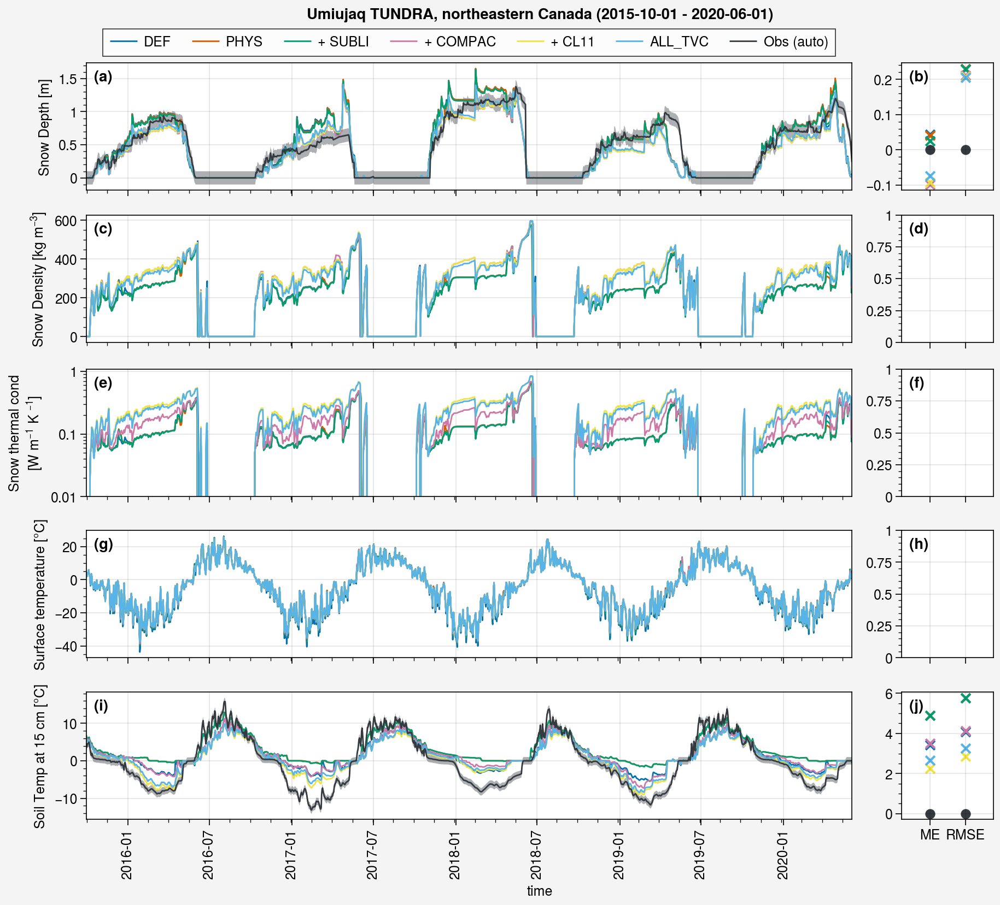

In [44]:
%matplotlib inline
color_obs = 'gray8'
period = slice('2015-10-01', '2020-06-01')

mask_sd = ds_d_obs.snd_auto.sel(time=period) >= 0.1

# fig, axs = pplt.subplots(nrows=3, ncols=2, refaspect=3.5, sharey=0, figsize=(9,6))
# fig, axs = pplt.subplots(nrows=5, ncols=2, refaspect=3.5, refwidth=6, sharey=0)
fig, axs = pplt.subplots(nrows=5, ncols=2, refaspect=6, refwidth=7, sharey=0, wratios=(1, 0.12))
k = 0
##################
### Snow Depth ###
##################
ax = axs[k]
# Simus
for i, (ds_d, label, label_exp) in enumerate(zip(ds_d_list, labels, label_exps)):
    if i < 6:
        ax.plot(ds_d.snd.sel(time=period), label=label_exp, lw=1)
    else:
        ax.plot(ds_d.snd.sel(time=period), label=label_exp, lw=1, ls='--', c='C0')

    df_metrics.loc[('snd_auto', 'RMSE'), label] = (xs.rmse(ds_d.snd.sel(time=period).where(mask_sd), 
                                                        ds_d_obs.snd_auto.sel(time=period).where(mask_sd), skipna=True)).values
    df_metrics.loc[('snd_auto', 'ME'), label] = (xs.me(ds_d.snd.sel(time=period).where(mask_sd), 
                                                      ds_d_obs.snd_auto.sel(time=period).where(mask_sd), skipna=True)).values


# Obs
shadedata = np.concatenate((
    np.expand_dims(ds_d_obs.snd_auto.sel(time=period).values+0.1, axis=0),
    np.expand_dims(ds_d_obs.snd_auto.sel(time=period).values-0.1, axis=0),), axis=0)
ax.plot(ds_d_obs.snd_auto.sel(time=period), shadedata=shadedata, color=color_obs, label='Obs (auto)', lw=1)
ax.format(ylabel='Snow Depth [m]')

k += 1
ax = axs[k]
ax.scatter(df_metrics.loc[('snd_auto'), df_metrics.columns.get_level_values(0)[1:]], marker='x')
ax.scatter(df_metrics.loc[('snd_auto', 'Obs')], color=color_obs)
# ax.scatter(df_metrics.loc[('snd_auto', 'peat_TCZE_REF_TSNB_REF')], color='C0')
ax.format(xlim=(-0.8, 1.8))

 

k += 1
##################
### Snow dens ###
##################
ax = axs[k]

# Simus
for i, (ds_d, label, label_exp) in enumerate(zip(ds_d_list, labels, label_exps)):
    if i < 6:
        ax.plot(ds_d.snwdens.sel(time=period), label=label_exp, lw=1)
    else:
        ax.plot(ds_d.snwdens.sel(time=period), label=label_exp, lw=1, ls='--', c='C0')
    # Get the snow density 15 days before the measurement ones because early snowmelt in the model leading to 
    # too high densities... (arbitrary, but more representative in my opinion)
    # df_metrics.loc[('snwdens', 'RMSE'), label] = (xs.rmse(ds_d.snwdens.sel(time=period).where(mask_sd).shift(time=30).rolling(time=30).mean(), 
    #                                                     ds_d_obs.snwdens.sel(time=period).where(mask_sd), skipna=True)).values
    # df_metrics.loc[('snwdens', 'ME'), label] = (xs.me(ds_d.snwdens.sel(time=period).where(mask_sd).shift(time=30).rolling(time=30).mean(), 
    #                                                   ds_d_obs.snwdens.sel(time=period).where(mask_sd), skipna=True)).values
    
# Obs
# ax.plot(ds_d_list[0].snwdens.sel(time=period).shift(time=15).where(ds_d_obs.snwdens.sel(time=period) > 0).shift(time=-15), 
#         color='C0', marker='x')
# ax.plot(ds_d_obs.snwdens.sel(time=period), color=color_obs, marker='o')
ax.format(ylabel='Snow Density [kg m$^{-3}$]')

k += 1
ax = axs[k]
# ax.scatter(df_metrics.loc[('snwdens'), df_metrics.columns.get_level_values(0)[1:]], marker='x')
# ax.scatter(df_metrics.loc[('snwdens', 'Obs')], color=color_obs)
# ax.scatter(df_metrics.loc[('snwdens', 'peat_TCZE_REF_TSNB_REF')], color='C0')


k += 1
##################
### Thermal cond in snow ###
##################
ax = axs[k]

# color_dh = 'cyan4'
# color_ws = 'indigo4'
# color_mid = 'grape4'

# # Obs
# ax.plot(tcs_hmean.sel(time=period), label='Obs (hmean)', color=color_obs, lw=1)
# ax.plot(ds_obs_tc.tcs.sel(time=period, sheight=0.02), label='Obs (2 cm)', lw=1, ls='--', c=color_dh)
# ax.plot(ds_obs_tc.tcs.sel(time=period, sheight=0.12), label='Obs (12 cm)', lw=1, ls='--', c=color_mid)
# ax.plot(ds_obs_tc.tcs.sel(time=period, sheight=0.22), label='Obs (22 cm)', lw=1, ls='--', c=color_ws)
ax.format(ylabel='Snow thermal cond\n[W m$^{-1}$ K $^{-1}$]', yscale='log')
# ax.legend(ncols=5, loc='ur')

for i, (ds_d, label, label_exp) in enumerate(zip(ds_d_list, labels, label_exps)):
    ax.plot(ds_d.tcsnow.sel(time=period), label=label_exp, lw=1)
    # df_metrics.loc[('tcsnow', 'RMSE'), label] = (xs.rmse(ds_d.tcsnow.sel(time=tcs_hmean.sel(time=period).time).where(mask_sd), 
    #                                                     tcs_hmean.sel(time=period).where(mask_sd), skipna=True)).values
    # df_metrics.loc[('tcsnow', 'ME'), label] = (xs.me(ds_d.tcsnow.sel(time=tcs_hmean.sel(time=period).time).where(mask_sd), 
    #                                                   tcs_hmean.sel(time=period).where(mask_sd), skipna=True)).values
ax.format(ymin=0.01)


k += 1
ax = axs[k]
# ax.scatter(df_metrics.loc[('tcsnow'), df_metrics.columns.get_level_values(0)[1:]], marker='x')
# ax.scatter(df_metrics.loc[('tcsnow', 'Obs')], color=color_obs)
# ax.scatter(df_metrics.loc[('snwdens', 'peat_TCZE_REF_TSNB_REF')], color='C0')


k += 1
##################
### T surf ###
##################
ax = axs[k]

# Simus
for i, (ds_d, label, label_exp) in enumerate(zip(ds_d_list, labels, label_exps)):
    if i < 6:
        ax.plot(ds_d.ts.sel(time=period)-273.15, label=label_exp, lw=1)
    else:
        ax.plot(ds_d.ts.sel(time=period)-273.15, label=label_exp, lw=1, ls='--', c='C0')
    # df_metrics.loc[('ts', 'RMSE'), label] = (xs.rmse(ds_d.ts.sel(time=period).where(mask_sd)-273.15, 
    #                                                     ds_d_obs.ts.sel(time=period).where(mask_sd), skipna=True)).values
    # df_metrics.loc[('ts', 'ME'), label] = (xs.me(ds_d.ts.sel(time=period).where(mask_sd)-273.15, 
    #                                                   ds_d_obs.ts.sel(time=period).where(mask_sd), skipna=True)).values
    
# Obs
# ax.plot(ds_d_obs.ts.sel(time=period), color=color_obs, lw=1)
ax.format(ylabel='Surface temperature [°C]')

k += 1
ax = axs[k]
# ax.scatter(df_metrics.loc[('ts'), df_metrics.columns.get_level_values(0)[1:]], marker='x')
# ax.scatter(df_metrics.loc[('ts', 'Obs')], color=color_obs)
# ax.scatter(df_metrics.loc[('ts', 'peat_TCZE_REF_TSNB_REF')], color='C0')


# k += 1
# ##################
# ### T snow ###
# ##################
# ax = axs[k]

# # Simus
# for i, (ds_d, label, label_exp) in enumerate(zip(ds_d_list, labels, label_exps)):
#     if i < 6:
#         ax.plot(ds_d.tsn.sel(time=period), label=label_exp, lw=1)
#     else:
#         ax.plot(ds_d.tsn.sel(time=period), label=label_exp, lw=1, ls='--', c='C0')
#     df_metrics.loc[('tsn', 'RMSE'), label] = (xs.rmse(ds_d.tsn.sel(time=period).where(mask_sd), 
#                                                         ds_d_obs.tsn.sel(time=period).where(mask_sd), skipna=True)).values
#     df_metrics.loc[('tsn', 'ME'), label] = (xs.me(ds_d.tsn.sel(time=period).where(mask_sd), 
#                                                       ds_d_obs.tsn.sel(time=period).where(mask_sd), skipna=True)).values
    
# # Obs
# ax.plot(ds_d_obs.tsn.sel(time=period), color=color_obs, lw=1)
# ax.format(ylabel='Snow temperature [°C]')

# k += 1
# ax = axs[k]
# ax.scatter(df_metrics.loc[('tsn'), df_metrics.columns.get_level_values(0)[1:]], marker='x')
# ax.scatter(df_metrics.loc[('tsn', 'Obs')], color=color_obs)
# # ax.scatter(df_metrics.loc[('tsn', 'peat_TCZE_REF_TSNB_REF')], color='C0')


# k += 1
# ##################
# ### TSNBOT ###
# ##################
# ax = axs[k]

# # Simus
# for i, (ds_d, label, label_exp) in enumerate(zip(ds_d_list, labels, label_exps)):
#     if i < 6:
#         ax.plot(ds_d.tsnbot.sel(time=period), label=label_exp, lw=1)
#     else:
#         ax.plot(ds_d.tsnbot.sel(time=period), label=label_exp, lw=1, ls='--', c='C0')
#     df_metrics.loc[('tsnbot', 'RMSE'), label] = (xs.rmse(ds_d.tsnbot.sel(time=period).where(mask_sd), 
#                                                         TSNBOT_obs_day.sel(time=period).where(mask_sd), skipna=True)).values
#     df_metrics.loc[('tsnbot', 'ME'), label] = (xs.me(ds_d.tsnbot.sel(time=period).where(mask_sd), 
#                                                       TSNBOT_obs_day.sel(time=period).where(mask_sd), skipna=True)).values
    
# # Obs
# ax.plot(TSNBOT_obs_day.sel(time=period), color=color_obs, lw=1) 
# ax.format(ylabel='Bottom snow temp [°C]')

# k += 1
# ax = axs[k]
# ax.scatter(df_metrics.loc[('tsnbot'), df_metrics.columns.get_level_values(0)[1:]], marker='x')
# ax.scatter(df_metrics.loc[('tsnbot', 'Obs')], color=color_obs)
# # ax.scatter(df_metrics.loc[('tsnbot', 'peat_TCZE_REF_TSNB_REF')], color='C0')


k += 1
##################
### T soil ###
##################
ax = axs[k]

# Simus
for i, (ds_d, label, label_exp) in enumerate(zip(ds_d_list, labels, label_exps)):
    if i < 6:
        ax.plot(ds_d.tsl.sel(time=period).sel(layer=0.15, method='nearest')-273.15, label=label_exp, lw=1)
    else:
        ax.plot(ds_d.tsl.sel(time=period).sel(layer=0.15, method='nearest')-273.15, label=label_exp, lw=1, ls='--', c='C0')
    df_metrics.loc[('tsl_15', 'RMSE'), label] = (xs.rmse(ds_d.tsl.sel(time=period).sel(layer=0.15, method='nearest').where(mask_sd)-273.15, 
                                                        ds_d_obs.tsl.mean('veg').sel(time=period, sdepth=0.15).where(mask_sd), skipna=True)).values
    df_metrics.loc[('tsl_15', 'ME'), label] = (xs.me(ds_d.tsl.sel(time=period).sel(layer=0.15, method='nearest').where(mask_sd)-273.15, 
                                                      ds_d_obs.tsl.mean('veg').sel(time=period, sdepth=0.15).where(mask_sd), skipna=True)).values
    
# Obs
shadedata = np.concatenate((
    np.expand_dims(ds_d_obs.tsl.mean('veg').sel(time=period, sdepth=0.15)+1, axis=0),
    np.expand_dims(ds_d_obs.tsl.mean('veg').sel(time=period, sdepth=0.15)-1, axis=0),), axis=0)
ax.plot(ds_d_obs.tsl.mean('veg').sel(time=period, sdepth=0.15), shadedata=shadedata, color=color_obs, label='Obs (15 cm)', lw=1)
ax.format(ylabel='Soil Temp at 15 cm [°C]')

k += 1
ax = axs[k]
ax.scatter(df_metrics.loc[('tsl_15'), df_metrics.columns.get_level_values(0)[1:]], marker='x')
ax.scatter(df_metrics.loc[('tsl_15', 'Obs')], color=color_obs)
# ax.scatter(df_metrics.loc[('tsl_5', 'peat_TCZE_REF_TSNB_REF')], color='C0')



# k += 1
# ax = axs[k]
# # Simus
# for i, (ds_d, label, label_exp) in enumerate(zip(ds_d_list, labels, label_exps)):
#     if i < 6:
#         ax.plot(ds_d.tsl.sel(time=period).sel(layer=0.15, method='nearest')-273.15, label=label_exp, lw=1)
#     else:
#         ax.plot(ds_d.tsl.sel(time=period).sel(layer=0.15, method='nearest')-273.15, label=label_exp, lw=1, ls='--', c='C0')
#     df_metrics.loc[('tsl_15', 'RMSE'), label] = (xs.rmse(ds_d.tsl.sel(time=period).sel(layer=0.15, method='nearest').where(mask_sd)-273.15, 
#                                                         ds_d_obs.tsl.sel(time=period, sdepth=0.15).where(mask_sd), skipna=True)).values
#     df_metrics.loc[('tsl_15', 'ME'), label] = (xs.me(ds_d.tsl.sel(time=period).sel(layer=0.15, method='nearest').where(mask_sd)-273.15, 
#                                                       ds_d_obs.tsl.sel(time=period, sdepth=0.15).where(mask_sd), skipna=True)).values
    
# # Obs
# shadedata = np.concatenate((
#     np.expand_dims(ds_d_obs.tsl.sel(time=period, sdepth=0.15)+1, axis=0),
#     np.expand_dims(ds_d_obs.tsl.sel(time=period, sdepth=0.15)-1, axis=0),), axis=0)
# ax.plot(ds_d_obs.tsl.sel(time=period, sdepth=0.15), shadedata=shadedata, color=color_obs, label='Obs (15 cm)', lw=1)
# ax.format(ylabel='Soil Temp at 15 cm [°C]')

# k += 1
# ax = axs[k]
# ax.scatter(df_metrics.loc[('tsl_15'), df_metrics.columns.get_level_values(0)[1:]], marker='x')
# ax.scatter(df_metrics.loc[('tsl_15', 'Obs')], color=color_obs)
# # ax.scatter(df_metrics.loc[('tsl_15', 'peat_TCZE_REF_TSNB_REF')], color='C0')




# # Simus
# for ds_d, label, label_exp in zip(ds_d_list, labels, label_exps):
#     ax.plot(ds_d.tsl.sel(time=period, layer=0.05)-273.15, label=label_exp+' (layer 1)')
    
# # Obs
# shadedata = np.concatenate((
#     np.expand_dims(ds_d_obs.tsl.sel(time=period, sdepth=0.05)+1, axis=0),
#     np.expand_dims(ds_d_obs.tsl.sel(time=period, sdepth=0.05)-1, axis=0),), axis=0)
# ax.plot(ds_d_obs.tsl.sel(time=period, sdepth=0.05), shadedata=shadedata, color=color_obs, label='Obs (5 cm)')
# # ax.plot(ds_d_obs.tsl.sel(time=period, sdepth=[0.02, 0.05, 0.1]).integrate('sdepth')/(0.1-0.02), color='red')

# ax.hlines(0, ds_d.tsl.sel(time=period).time[0], ds_d.tsl.sel(time=period).time[-1], c=color_obs, lw=1, alpha=0.5)
# ax.format(ylabel='Soil Temp at 5 cm [°C]')
# ax.legend()

# k += 1
# ax = axs[k]
# # Simus
# for ds_d, label, label_exp in zip(ds_d_list, labels, label_exps):
#     ax.plot(ds_d.tsl.sel(time=period).sel(layer=0.15, method='nearest')-273.15, label=label_exp+' (layer 2)')

# # Obs
# shadedata = np.concatenate((
#     np.expand_dims(ds_d_obs.tsl.sel(time=period, sdepth=0.15)+1, axis=0),
#     np.expand_dims(ds_d_obs.tsl.sel(time=period, sdepth=0.15)-1, axis=0),), axis=0)
# ax.plot(ds_d_obs.tsl.sel(time=period, sdepth=0.15), shadedata=shadedata, color=color_obs, label='Obs (15 cm)')
# # ax.plot(ds_d_obs.tsl.sel(time=period, sdepth=[0.1, 0.15, 0.21]).integrate('sdepth')/(0.21-0.1), color='red')


# ax.hlines(0, ds_d.tsl.sel(time=period).time[0], ds_d.tsl.sel(time=period).time[-1], c=color_obs, lw=1, alpha=0.5)
# ax.format(ylabel='Soil Temp at 15 cm [°C]')
# ax.legend()



fig.suptitle(site_longname + ' ('+period.start+' - '+period.stop+')')
fig.format(abc='(a)', abcloc='ul')
axs[0].legend(ncols=7, loc='t')


# fig.save('img/'+site+'_paper_all_2016-2020_correct_SH.png')
# fig.save('img/'+site+'_paper_all_2016-2020_correct_SH.jpg')
# fig.save('img/'+site+'_paper_all_2016-2020_correct_SH.pdf')

## Turbulent fluxes

In [30]:
path_obs = '/home/lalandmi/Dropbox/data/ESM-SnowMIP_all/Umiujaq/Domine-etal_2024/datasets'
df_turb = pd.read_csv(path_obs+'/Umiujaq_turbulent_CO2_flux.tab', skiprows=29, delimiter='\t', parse_dates=['Date/Time'], index_col=['Date/Time'])
df_turb

,Qh [W/m**2],QF Qh,Qe [W/m**2],QF Qe,CO2 flux [µmol/m**2/s],QF CO2 flux
Date/Time,,,,,,
2017-06-10 15:00:00,76.441,1,-23.175,1,-7.882,0
2017-06-10 15:30:00,83.783,1,82.376,1,0.983,0
2017-06-10 16:00:00,76.397,1,46.145,1,-3.274,0
2017-06-10 16:30:00,77.477,1,46.932,1,-9.641,0
2017-06-10 17:00:00,78.918,1,-28.091,1,-1.614,1
...,...,...,...,...,...,...
2020-04-30 17:00:00,3.892,0,10.298,0,-0.067,0
2020-04-30 17:30:00,-1.309,0,3.916,0,-0.105,0
2020-04-30 18:00:00,-4.647,0,1.461,0,-0.081,0


In [31]:
ds_d_list[0]

<xarray.Dataset> Size: 4MB
Dimensions:     (time: 3653, layer: 20)
Coordinates:
  * time        (time) datetime64[ns] 29kB 2012-01-01 2012-01-02 ... 2021-12-31
  * layer       (layer) float64 160B 0.05 0.15 0.25 0.35 ... 8.9 18.9 41.4 58.9
Data variables: (12/54)
    longitude   float64 8B -76.48
    latitude    float64 8B 56.56
    actlyr      (time) float64 29kB 61.33 61.32 61.32 ... 61.35 61.34 61.34
    albs        (time) float64 29kB 0.8396 0.8396 0.8396 ... 0.8337 0.8124
    albsir      (time) float64 29kB 0.7297 0.7297 0.7297 ... 0.7225 0.6966
    albsn       (time) float64 29kB 0.84 0.84 0.84 ... 0.8388 0.8343 0.8123
    ...          ...
    tsn         (time) float64 29kB -1.75 -1.82 -1.85 ... -2.169 -1.972 -1.801
    tsnbot      (time) float64 29kB -1.618 -1.681 -1.706 ... -1.836 -1.672
    vegHeight   (time) float64 29kB 0.1045 0.1045 0.1045 ... 0.1058 0.1058
    wsnw        (time) float64 29kB 0.0 0.0 0.0 0.0 0.0 ... 0.0 0.0 0.0 0.0 0.0
    wtd         (time) float64 29kB 9.999e+03 9.999e+03 ... 9.999e+03 9.999e+03
    zpond       (time) float64 29kB 0.0 0.0 0.0 0.0 0.0 ... 0.0 0.0 0.0 0.0 0.0
Attributes:
    title:        CLASSIC output file
    timestamp:    20250618 1518
    Conventions:  COARDS
    node_offset:  1
    Comment:       run_DEF_correct_SH

In [32]:
ds_turb = df_turb.to_xarray()
ds_turb = ds_turb.rename({'Date/Time': 'time', 'Qh [W/m**2]': 'hfss', 'Qe [W/m**2]': 'hfls', 'CO2 flux [µmol/m**2/s]': 'nee'})
ds_turb['hfss'].attrs = {'units': 'W/m$^2$'}
ds_turb['hfls'].attrs = {'units': 'W/m$^2$'}
ds_turb['nee'].attrs = {'units': 'µmol m$^{-2}$ s$^{-1}$'}
ds_turb

<xarray.Dataset> Size: 3MB
Dimensions:      (time: 50649)
Coordinates:
  * time         (time) datetime64[ns] 405kB 2017-06-10T15:00:00 ... 2020-04-...
Data variables:
    hfss         (time) float64 405kB 76.44 83.78 76.4 ... -4.647 -7.894 -10.42
    QF Qh        (time) int64 405kB 1 1 1 1 1 1 1 1 1 1 ... 0 0 0 0 0 0 0 0 0 0
    hfls         (time) float64 405kB -23.18 82.38 46.15 ... 1.461 -0.158 -0.081
    QF Qe        (time) int64 405kB 1 1 1 1 1 1 1 1 1 1 ... 0 0 0 0 0 0 0 0 0 0
    nee          (time) float64 405kB -7.882 0.983 -3.274 ... -0.022 0.137
    QF CO2 flux  (time) int64 405kB 0 0 0 0 1 1 1 1 1 1 ... 0 0 0 0 0 0 0 0 0 0

In [33]:
ds_d_turb = ds_turb.resample(time='D').mean().load()
ds_d_turb

<xarray.Dataset> Size: 59kB
Dimensions:      (time: 1056)
Coordinates:
  * time         (time) datetime64[ns] 8kB 2017-06-10 2017-06-11 ... 2020-04-30
Data variables:
    hfss         (time) float64 8kB 25.74 52.04 8.584 ... -21.79 -4.363 -3.511
    QF Qh        (time) float64 8kB 1.0 0.04167 0.0 0.375 ... 0.2083 0.0 0.0 0.0
    hfls         (time) float64 8kB -19.92 35.8 14.05 ... 6.472 5.114 1.974
    QF Qe        (time) float64 8kB 1.0 0.2708 0.3542 0.7708 ... 0.0 0.0 0.0 0.0
    nee          (time) float64 8kB -0.6061 -0.8551 -0.6676 ... -0.1087 -0.01772
    QF CO2 flux  (time) float64 8kB 0.7778 0.1042 0.3333 0.7708 ... 0.0 0.0 0.0

In [34]:
ds_d_list[0].hfls.units

'W/m$^2$'

In [35]:
y_start_obs = 2016
tot_year = y_end - y_start_obs + 1
gap = 4
years = pplt.arange(y_start_obs, y_end)
years

array([2016, 2017, 2018, 2019, 2020, 2021])

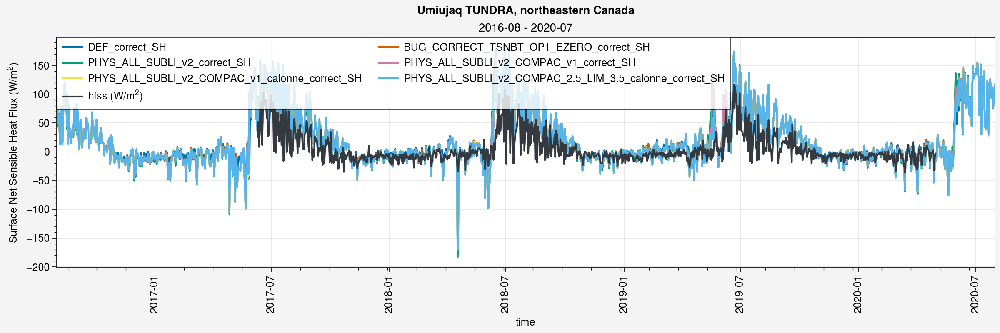

In [36]:
%matplotlib inline

color_obs = 'gray8'

for i in range(tot_year//gap):
    fig, axs = pplt.subplots(ncols=1, nrows=1, figsize=(12,4))

    if i*gap+gap < tot_year:
        period=slice(str(years[i*gap])+'-08',str(years[i*gap+gap])+'-07')
    else:
        period=slice(str(years[i*gap])+'-08',str(years[-1])+'-07')
    
    # Simus
    for ds_d, label in zip(ds_d_list, labels):
        axs[0].plot(ds_d.hfss.sel(time=period), label=label)
    
    # Obs
    axs[0].plot(ds_d_turb.hfss.sel(time=period), color=color_obs)
    
    axs[0].legend(loc='ul', ncols=2)
    axs[0].format(title=period.start+' - '+period.stop)
    
    fig.suptitle(site_longname)
    # fig.save('bylot_snd.pdf')

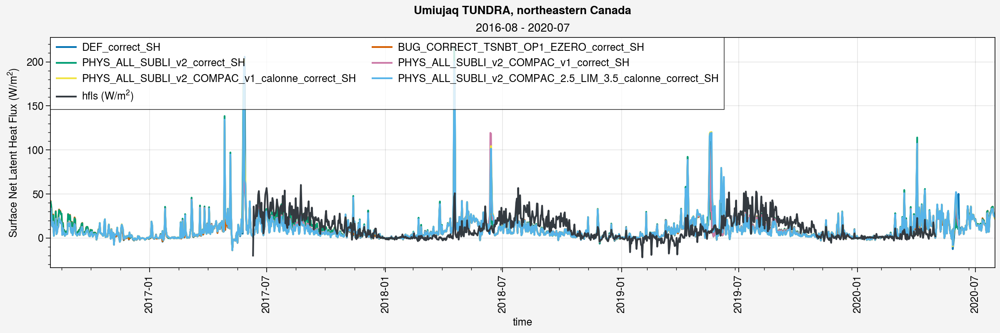

In [37]:
%matplotlib inline

color_obs = 'gray8'

for i in range(tot_year//gap):
    fig, axs = pplt.subplots(ncols=1, nrows=1, figsize=(12,4))

    if i*gap+gap < tot_year:
        period=slice(str(years[i*gap])+'-08',str(years[i*gap+gap])+'-07')
    else:
        period=slice(str(years[i*gap])+'-08',str(years[-1])+'-07')
    
    # Simus
    for ds_d, label in zip(ds_d_list, labels):
        axs[0].plot(ds_d.hfls.sel(time=period), label=label)
    
    # Obs
    axs[0].plot(ds_d_turb.hfls.sel(time=period), color=color_obs)
    
    axs[0].legend(loc='ul', ncols=2)
    axs[0].format(title=period.start+' - '+period.stop)
    
    fig.suptitle(site_longname)
    # fig.save('bylot_snd.pdf')

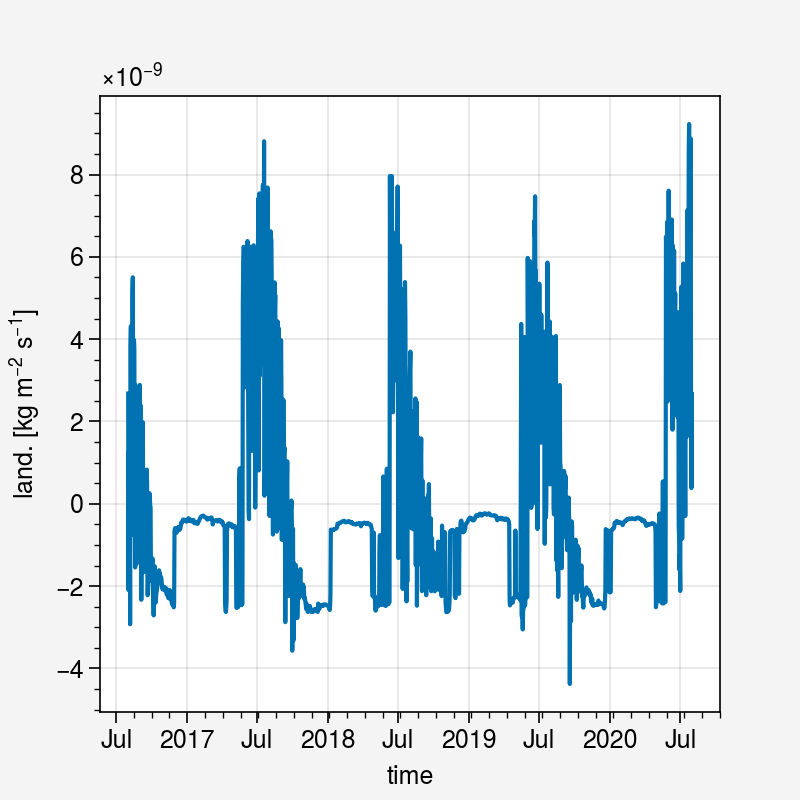

In [38]:
ds_d.nep.sel(time=period).plot()

Text(0.5, 0.98, 'Umiujaq TUNDRA, northeastern Canada')

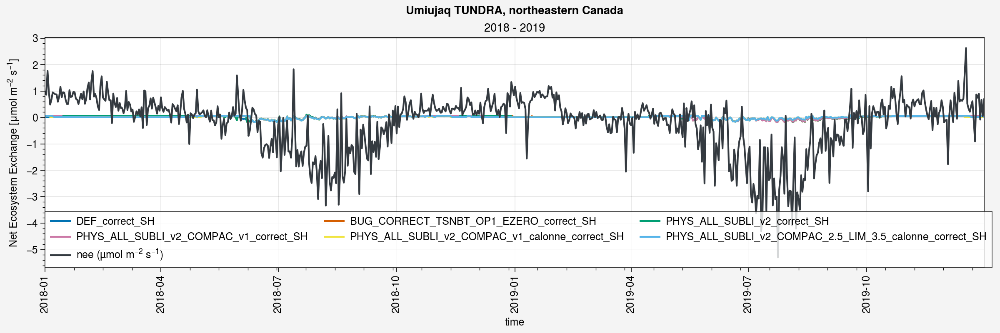

In [39]:
%matplotlib inline

color_obs = 'gray8'

fig, axs = pplt.subplots(ncols=1, nrows=1, figsize=(12,4))

period=slice('2018','2019')

# Simus
for ds_d, label in zip(ds_d_list, labels):
    axs[0].plot(-ds_d.nep.sel(time=period)/(44.01e-9), label=label)

# Obs
axs[0].plot(ds_d_turb.nee.sel(time=period), color=color_obs)

axs[0].legend(ncols=3)
axs[0].format(
    title = period.start+' - '+period.stop,
    ylabel = 'Net Ecosystem Exchange [$\mu$mol m$^{-2}$ s$^{-1}$]'
)

fig.suptitle(site_longname)
# fig.save('bylot_snd.pdf')

Text(0.5, 0.98, 'Umiujaq TUNDRA, northeastern Canada')

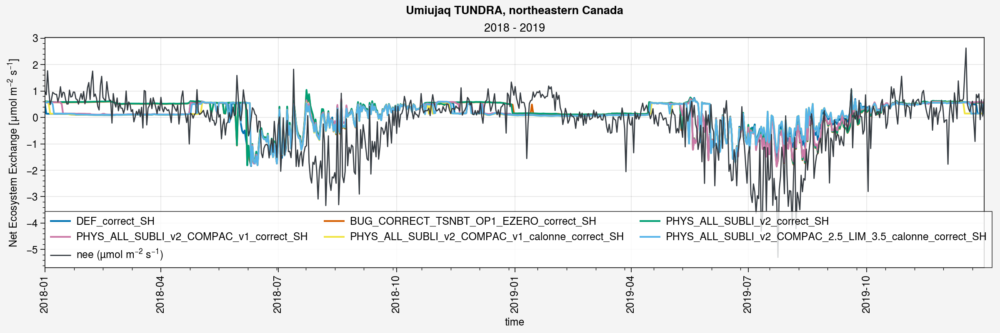

In [40]:
%matplotlib inline

color_obs = 'gray8'

fig, axs = pplt.subplots(ncols=1, nrows=1, figsize=(12,4))

period=slice('2018','2019')

# Simus
for ds_d, label in zip(ds_d_list, labels):
    axs[0].plot(-ds_d.nep.sel(time=period)/(44.01e-9)*10, label=label)

# Obs
axs[0].plot(ds_d_turb.nee.sel(time=period), color=color_obs, lw=1)

axs[0].legend(ncols=3)
axs[0].format(
    title = period.start+' - '+period.stop,
    ylabel = 'Net Ecosystem Exchange [$\mu$mol m$^{-2}$ s$^{-1}$]'
)

fig.suptitle(site_longname)
# fig.save('bylot_snd.pdf')

Text(0.5, 0.98, 'Umiujaq TUNDRA, northeastern Canada')

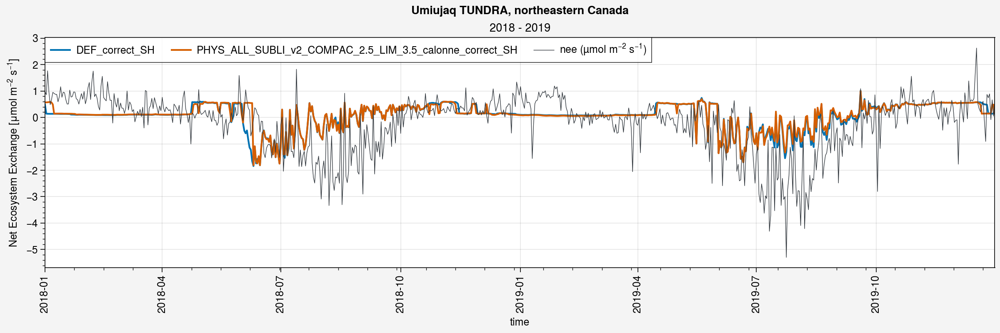

In [41]:
%matplotlib inline

color_obs = 'gray8'

fig, axs = pplt.subplots(ncols=1, nrows=1, figsize=(12,4))

period=slice('2018','2019')

# Simus
# for ds_d, label in zip(ds_d_list, labels):
#     axs[0].plot(-ds_d.nep.sel(time=period)/(44.01e-9)*10, label=label)

axs[0].plot(-ds_d_list[0].nep.sel(time=period)/(44.01e-9)*10, label=labels[0])
axs[0].plot(-ds_d_list[-1].nep.sel(time=period)/(44.01e-9)*10, label=labels[-1])



# Obs
axs[0].plot(ds_d_turb.nee.sel(time=period), color=color_obs, lw=0.5)

axs[0].legend(ncols=3)
axs[0].format(
    title = period.start+' - '+period.stop,
    ylabel = 'Net Ecosystem Exchange [$\mu$mol m$^{-2}$ s$^{-1}$]'
)

fig.suptitle(site_longname)
# fig.save('bylot_snd.pdf')

Text(0.5, 0.98, 'Umiujaq TUNDRA, northeastern Canada')

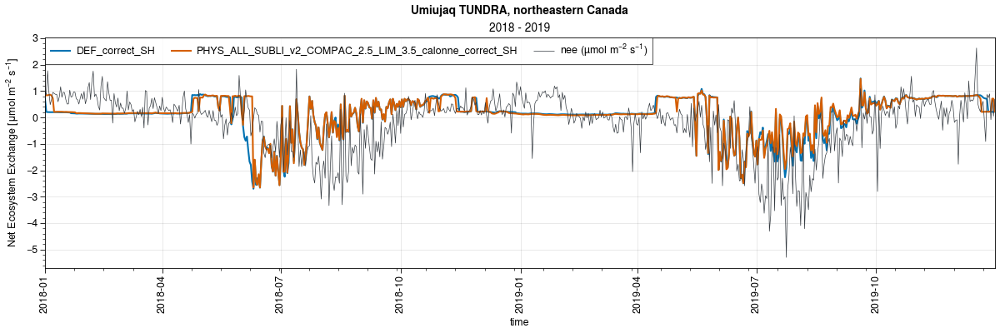

In [42]:
%matplotlib widget

color_obs = 'gray8'

fig, axs = pplt.subplots(ncols=1, nrows=1, figsize=(12,4))

period=slice('2018','2019')

# Simus
# for ds_d, label in zip(ds_d_list, labels):
#     axs[0].plot(-ds_d.nep.sel(time=period)/(44.01e-9)*10, label=label)

axs[0].plot(-ds_d_list[0].nep.sel(time=period)*8.33e7*4, label=labels[0])
axs[0].plot(-ds_d_list[-1].nep.sel(time=period)*8.33e7*4, label=labels[-1])



# Obs
axs[0].plot(ds_d_turb.nee.sel(time=period), color=color_obs, lw=0.5)

axs[0].legend(ncols=3)
axs[0].format(
    title = period.start+' - '+period.stop,
    ylabel = 'Net Ecosystem Exchange [$\mu$mol m$^{-2}$ s$^{-1}$]'
)

fig.suptitle(site_longname)
# fig.save('bylot_snd.pdf')

Text(0.5, 0.98, 'Umiujaq TUNDRA, northeastern Canada')

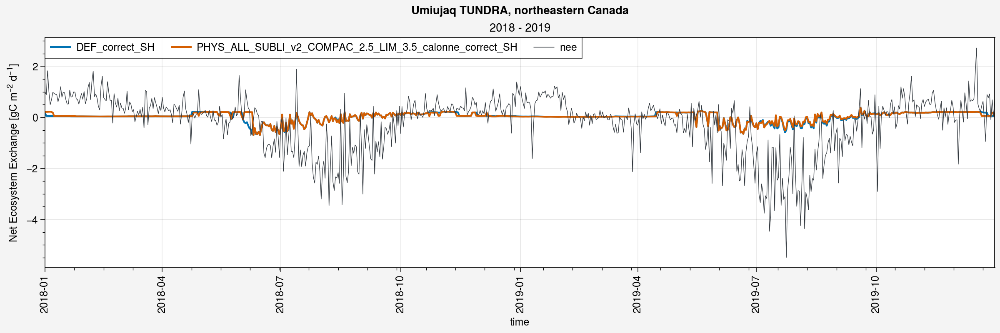

In [43]:
%matplotlib inline

color_obs = 'gray8'

fig, axs = pplt.subplots(ncols=1, nrows=1, figsize=(12,4))

period=slice('2018','2019')

# Simus
# for ds_d, label in zip(ds_d_list, labels):
#     axs[0].plot(-ds_d.nep.sel(time=period)/(44.01e-9)*10, label=label)

axs[0].plot(-ds_d_list[0].nep.sel(time=period)*86400000, label=labels[0])
axs[0].plot(-ds_d_list[-1].nep.sel(time=period)*86400000, label=labels[-1])



# Obs
axs[0].plot(ds_d_turb.nee.sel(time=period)*1.036, color=color_obs, lw=0.5)

axs[0].legend(ncols=3)
axs[0].format(
    title = period.start+' - '+period.stop,
    ylabel = 'Net Ecosystem Exchange [gC m$^{-2}$ d$^{-1}$]'
)

fig.suptitle(site_longname)
# fig.save('umt_carbon_fluxes_2018_2019.jpg')